# S & LS PLOT

## S

{'cuda0': {'0.5k': {7: {'BS': 2.2,
                        'ES': 16.1,
                        'NS': 81.7,
                        'Test_T': 357.77,
                        'Train_T': 80.21,
                        'test_metrics': {'ACC': 61.93,
                                         'F-1': 49.12,
                                         'FN': 15623.0,
                                         'FP': 3322.0,
                                         'PRC': 73.35,
                                         'REC': 36.92,
                                         'SPC': 86.71,
                                         'TN': 21677.0,
                                         'TP': 9145.0},
                        'test_subsets': [{'ACC': 82.89,
                                          'F1S': 89.83,
                                          'FN': 120.0,
                                          'FP': 68.0,
                                          'PRE': 92.43,
                                  

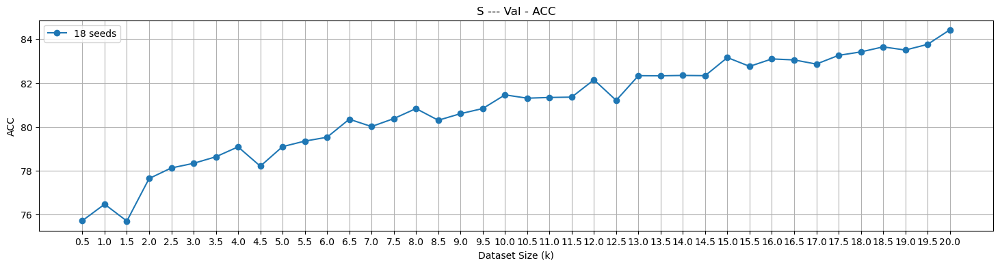

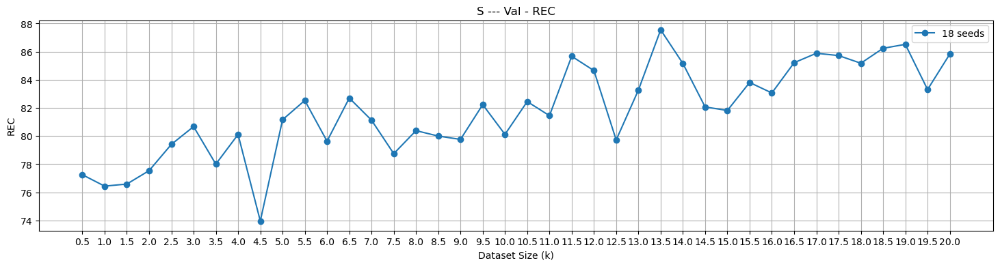

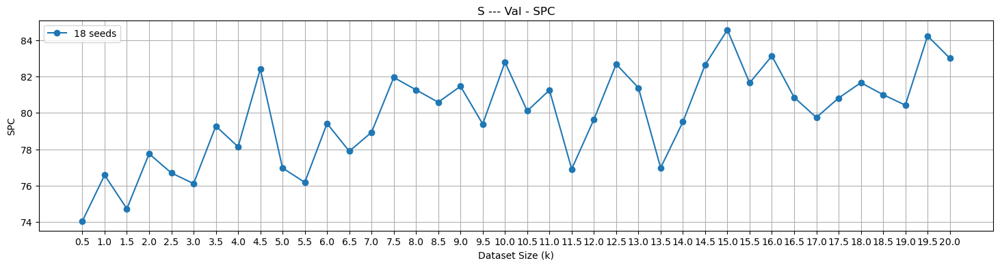

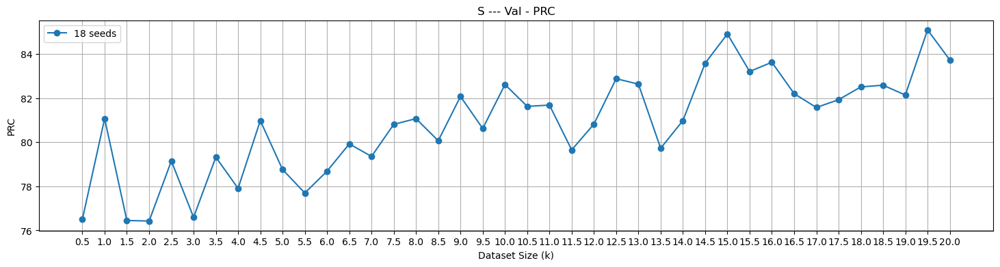

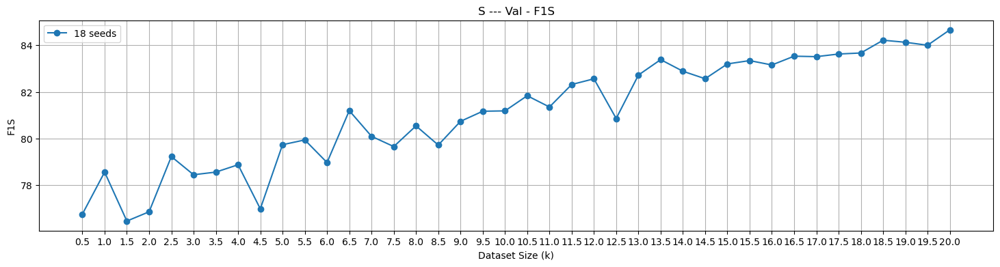

...

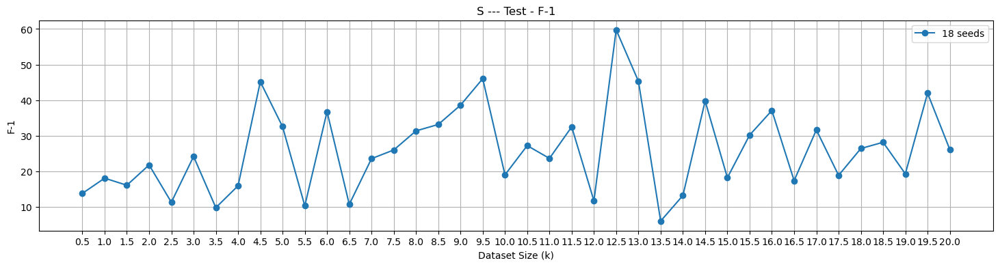

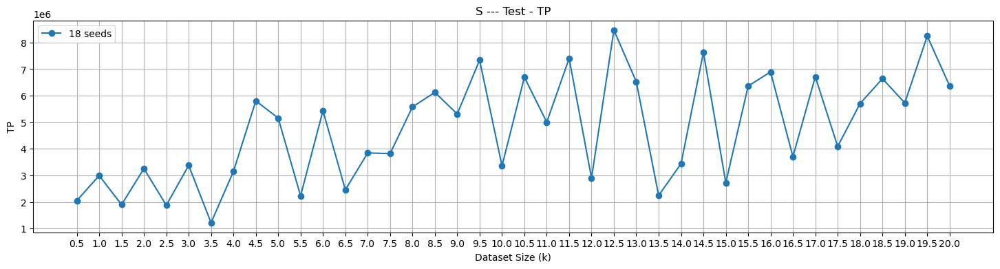

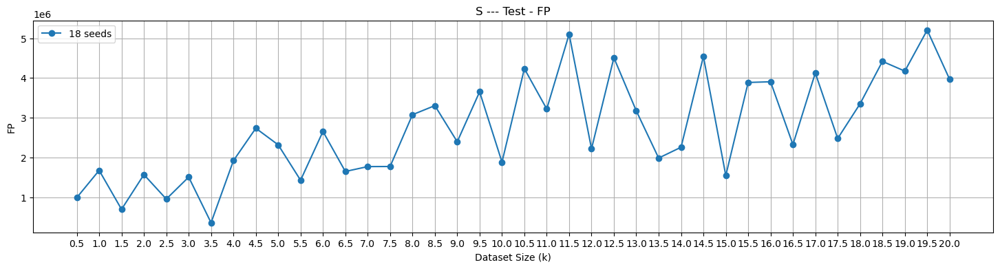

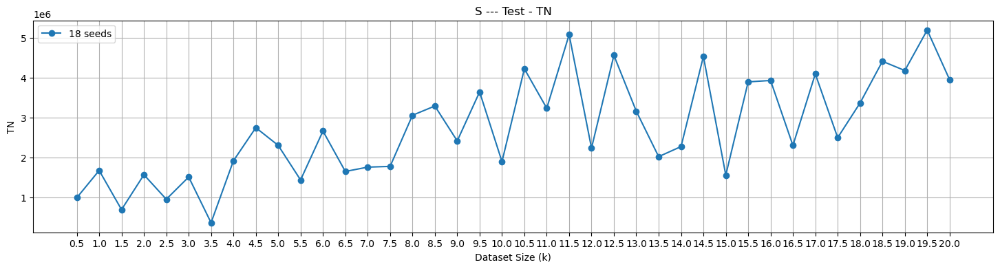

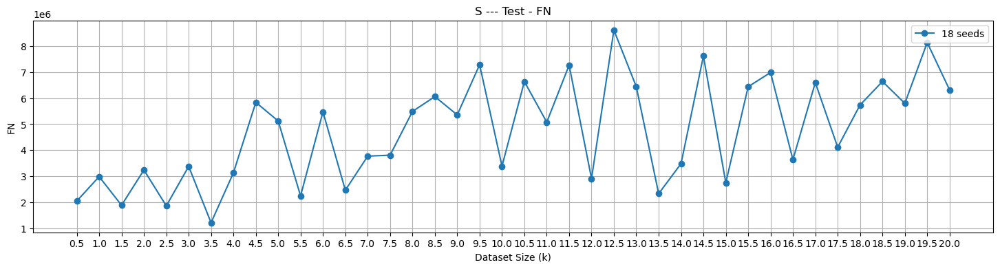

Average and Variance of each metric at each dataset size over 18 seeds (including all CUDA files):

--- VAL METRICS ---

Metric: ACC
Dataset Size: 0.5k, Avg: 75.7222, Var: 13.2006
Dataset Size: 1.0k, Avg: 76.4722, Var: 9.8187
Dataset Size: 1.5k, Avg: 75.7039, Var: 5.0554
Dataset Size: 2.0k, Avg: 77.6435, Var: 5.6218
Dataset Size: 2.5k, Avg: 78.1259, Var: 3.6419
Dataset Size: 3.0k, Avg: 78.3365, Var: 2.3970
Dataset Size: 3.5k, Avg: 78.6346, Var: 2.4683
Dataset Size: 4.0k, Avg: 79.0874, Var: 2.6817
Dataset Size: 4.5k, Avg: 78.2072, Var: 3.9279
Dataset Size: 5.0k, Avg: 79.0981, Var: 1.0998
Dataset Size: 5.5k, Avg: 79.3502, Var: 2.0642
Dataset Size: 6.0k, Avg: 79.5261, Var: 1.2425
Dataset Size: 6.5k, Avg: 80.3487, Var: 1.1509
Dataset Size: 7.0k, Avg: 80.0139, Var: 1.5797
Dataset Size: 7.5k, Avg: 80.3765, Var: 1.0600
Dataset Size: 8.0k, Avg: 80.8343, Var: 0.9326
Dataset Size: 8.5k, Avg: 80.3011, Var: 1.7708
Dataset Size: 9.0k, Avg: 80.6015, Var: 0.9406
Dataset Size: 9.5k, Avg: 80.8343, Var:

In [30]:
### READ & PLOT S

import re
import matplotlib.pyplot as plt
import pprint

# List of files to read along with their identifiers
files = {
    "cuda0": "Dataset_NOSEEN_S_Investment_Log_cuda0.txt",
    "cuda1": "Dataset_NOSEEN_S_Investment_Log_cuda1.txt",
    "cuda2": "Dataset_NOSEEN_S_Investment_Log_cuda2.txt",
}

# Initialize the main dictionary to hold data from all files
S_main_data_dict = {}

for cuda_id, filename in files.items():
    with open(filename, 'r') as f:
        lines = f.readlines()

    # Initialize the dictionary for this file
    data_dict = {}

    # Initialize variables
    current_dataset_size = None
    current_seed = None
    current_BS = None
    current_ES = None
    current_NS = None
    val_metrics = {}
    test_metrics = {}
    test_subsets = []
    train_time = None
    test_time = None
    state = 'OUTSIDE'
    i = 0
    while i < len(lines):
        line = lines[i].strip()
        # Detect the start of a new record
        if '==================== Train:' in line:
            # If there's previous data, store it
            if current_dataset_size and current_seed is not None:
                if current_dataset_size not in data_dict:
                    data_dict[current_dataset_size] = {}
                if current_seed not in data_dict[current_dataset_size]:
                    data_dict[current_dataset_size][current_seed] = {}

                data_dict[current_dataset_size][current_seed]['BS'] = current_BS
                data_dict[current_dataset_size][current_seed]['ES'] = current_ES
                data_dict[current_dataset_size][current_seed]['NS'] = current_NS
                data_dict[current_dataset_size][current_seed]['val_metrics'] = val_metrics
                data_dict[current_dataset_size][current_seed]['test_metrics'] = test_metrics
                data_dict[current_dataset_size][current_seed]['test_subsets'] = test_subsets
                # Save the Train/Test Time:
                data_dict[current_dataset_size][current_seed]['Train_T'] = train_time
                data_dict[current_dataset_size][current_seed]['Test_T'] = test_time
            # Reset variables for new record
            current_BS = None
            current_ES = None
            current_NS = None
            val_metrics = {}
            test_metrics = {}
            test_subsets = []
            train_time = None
            test_time = None
            state = 'OUTSIDE'

            # Extract dataset size and seed
            m = re.search(r'own_data/S_Hm_(.+)_seed(\d+)_11.npy', line)
            if m:
                current_dataset_size = m.group(1)
                current_seed = int(m.group(2))  # Convert seed to integer
            else:
                current_dataset_size = None
                current_seed = None
        elif '===== Number of Seen Proteins' in line:
            # Extract BS, ES, NS
            m = re.search(r'BS: ([\d\.]+)  \|  ES: ([\d\.]+)  \|  NS: ([\d\.]+)', line)
            if m:
                current_BS = float(m.group(1))
                current_ES = float(m.group(2))
                current_NS = float(m.group(3))
        elif 'VALIDATION SET METRICS' in line:
            state = 'IN_VAL_METRICS'
            # Skip the next line if it's empty
            i += 1
            while i < len(lines) and lines[i].strip() == '':
                i += 1
            # Read headers
            headers = re.findall(r'\S+', lines[i].strip())
            # Skip separator line
            i += 2
            # Read data line
            data_line = lines[i].strip()
            data_values = re.findall(r'[\d\.\-]+', data_line)
            data_values = [float(v) for v in data_values]
            val_metrics = dict(zip(headers, data_values))
            state = 'OUTSIDE'
        elif 'TEST SET METRICS' in line:
            state = 'IN_TEST_METRICS'
            # Skip the next line if it's empty
            i += 1
            while i < len(lines) and lines[i].strip() == '':
                i += 1
            # Read headers
            headers = re.findall(r'\S+', lines[i].strip())
            # Skip separator line
            i += 2
            # Read data line
            data_line = lines[i].strip()
            data_values = re.findall(r'[\d\.\-]+', data_line)
            data_values = [float(v) for v in data_values]
            test_metrics = dict(zip(headers, data_values))
            # Now, read the subset metrics
            # Skip empty lines until we reach the subset headers
            i += 1
            while i < len(lines) and (lines[i].strip() == '' or '>>>>>Time' in lines[i]): # To handle >>>>>Time errors
                if '>>>>>Time' in lines[i]:
                    # print(current_dataset_size,current_seed)
                    train_time = float(re.findall(r'[\d\.\-]+', lines[i].strip())[0])
                    i += 1
                    test_time = float(re.findall(r'[\d\.\-]+', lines[i].strip())[0])
                    # print(train_time,test_time)
                i += 1
            if i < len(lines):
                subset_header_line = lines[i].strip()
                subset_headers = re.findall(r'\S+', subset_header_line)
                # Read the next three lines as data
                for _ in range(3):
                    # print(lines[i])
                    i += 1
                    data_line = lines[i].strip()
                    data_values = re.findall(r'[\d\.\-]+', data_line)
                    data_values = [float(v) for v in data_values]
                    subset_metrics = dict(zip(subset_headers, data_values))
                    test_subsets.append(subset_metrics)
                    # print(subset_metrics)
            state = 'OUTSIDE'
        else:
            pass
        i += 1
    # After processing all lines, store the last record
    if current_dataset_size and current_seed is not None:
        if current_dataset_size not in data_dict:
            data_dict[current_dataset_size] = {}
        if current_seed not in data_dict[current_dataset_size]:
            data_dict[current_dataset_size][current_seed] = {}

        data_dict[current_dataset_size][current_seed]['BS'] = current_BS
        data_dict[current_dataset_size][current_seed]['ES'] = current_ES
        data_dict[current_dataset_size][current_seed]['NS'] = current_NS
        data_dict[current_dataset_size][current_seed]['val_metrics'] = val_metrics
        data_dict[current_dataset_size][current_seed]['test_metrics'] = test_metrics
        data_dict[current_dataset_size][current_seed]['test_subsets'] = test_subsets
        # Save the Train/Test Time:
        data_dict[current_dataset_size][current_seed]['Train_T'] = train_time
        data_dict[current_dataset_size][current_seed]['Test_T'] = test_time




    # Store the data_dict for this file into the main_data_dict
    S_main_data_dict[cuda_id] = data_dict

# Now, collect metrics data for plotting and calculations
# Initialize metrics_data
metrics_data = {
    'val': {},  # metrics_data['val'][dataset_size][metric_name][seed][cuda_id] = value
    'test': {}  # metrics_data['test'][dataset_size][metric_name][seed][cuda_id] = value
}

# Collect metrics across all CUDA files
for cuda_id, data_dict in S_main_data_dict.items():
    for dataset_size, seeds_dict in data_dict.items():
        if dataset_size not in metrics_data['val']:
            metrics_data['val'][dataset_size] = {}
            metrics_data['test'][dataset_size] = {}
        for seed, metrics_dict in seeds_dict.items():
            val_metrics = metrics_dict['val_metrics']
            test_metrics = metrics_dict['test_metrics']
            for metric_name, value in val_metrics.items():
                if metric_name == 'F1S':
                    # print(metric_name)
                    # print(value)
                    rec = metrics_data['val'][dataset_size]['REC'][seed][cuda_id]
                    prc = metrics_data['val'][dataset_size]['PRC'][seed][cuda_id]
                    value = 2*(rec*prc)/(rec+prc)
                    # print(value)
                if metric_name not in metrics_data['val'][dataset_size]:
                    metrics_data['val'][dataset_size][metric_name] = {}
                if seed not in metrics_data['val'][dataset_size][metric_name]:
                    metrics_data['val'][dataset_size][metric_name][seed] = {}
                metrics_data['val'][dataset_size][metric_name][seed][cuda_id] = value
            for metric_name, value in test_metrics.items():
                # if metric_name == 'F-1':
                #     # print(metric_name)
                #     print(value)
                #     rec = metrics_data['test'][dataset_size]['REC'][seed][cuda_id]
                #     prc = metrics_data['test'][dataset_size]['PRC'][seed][cuda_id]
                #     value = 2*(rec*prc)/(rec+prc)
                #     print(value)
                if metric_name not in metrics_data['test'][dataset_size]:
                    metrics_data['test'][dataset_size][metric_name] = {}
                if seed not in metrics_data['test'][dataset_size][metric_name]:
                    metrics_data['test'][dataset_size][metric_name][seed] = {}
                metrics_data['test'][dataset_size][metric_name][seed][cuda_id] = value

pprint.pprint(S_main_data_dict)

# Now, calculate averages for each metric at each dataset size over varying numbers of seeds
metrics_avg = {
    'val': {},
    'test': {}
}

metrics_var = {
    'val': {},
    'test': {}
}

num_seeds_list = [18]
seeds_list = [126, 119, 112, 105, 98, 91, 84, 77, 70, 63, 56, 49, 42, 35, 28, 21, 14, 7]

for metric_type in ['val', 'test']:
    for dataset_size in metrics_data[metric_type]:
        for metric_name in metrics_data[metric_type][dataset_size]:
            if metric_name not in metrics_avg[metric_type]:
                metrics_avg[metric_type][metric_name] = {}
                metrics_var[metric_type][metric_name] = {}
            if dataset_size not in metrics_avg[metric_type][metric_name]:
                metrics_avg[metric_type][metric_name][dataset_size] = {}
                metrics_var[metric_type][metric_name][dataset_size] = {}
            for num_seeds in num_seeds_list:
                selected_seeds = seeds_list[:num_seeds]
                values = []
                for seed in selected_seeds:
                    if seed in metrics_data[metric_type][dataset_size][metric_name]:
                        for cuda_id in metrics_data[metric_type][dataset_size][metric_name][seed]:
                            value = metrics_data[metric_type][dataset_size][metric_name][seed][cuda_id]
                            values.append(value)
                if values:
                    avg_value = sum(values) / len(values)
                    var_value = sum((x - avg_value) ** 2 for x in values) / len(values)
                    metrics_avg[metric_type][metric_name][dataset_size][num_seeds] = avg_value
                    metrics_var[metric_type][metric_name][dataset_size][num_seeds] = var_value
                else:
                    # If no values are found, set avg and var to None
                    metrics_avg[metric_type][metric_name][dataset_size][num_seeds] = None
                    metrics_var[metric_type][metric_name][dataset_size][num_seeds] = None


# Now, plot the averages for each metric ov er varying numbers of seeds
def plot_metrics(metrics_avg, metric_type, title_prefix):
    for metric_name in metrics_avg[metric_type]:
        dataset_sizes = sorted(metrics_avg[metric_type][metric_name].keys(), key=lambda x: float(x.replace('k', '')))
        x_values = [float(ds.replace('k', '')) for ds in dataset_sizes]
        plt.figure(figsize=(18, 4))
        for num_seeds in num_seeds_list:
            y_values = []
            for ds in dataset_sizes:
                avg_value = metrics_avg[metric_type][metric_name][ds].get(num_seeds, None)
                y_values.append(avg_value)
            plt.plot(x_values, y_values, marker='o', label=f'{num_seeds} seeds')
        plt.title(f'{title_prefix} {metric_name}')
        plt.xlabel('Dataset Size (k)')
        plt.ylabel(metric_name)
        plt.grid(True)
        plt.xticks(x_values)
        plt.legend()
        plt.show()

### SAVE THE MTERICS TO L/LS
S_metrics_avg = metrics_avg
S_metrics_var = metrics_var
# print(metrics_avg)

# Plot validation metrics
plot_metrics(S_metrics_avg, 'val', 'S --- Val -')

# Plot test metrics
plot_metrics(S_metrics_var, 'test', 'S --- Test -')

# Now, print the average and variance of each metric at each dataset size over 18 seeds
selected_num_seeds = 18
print("Average and Variance of each metric at each dataset size over 18 seeds (including all CUDA files):\n")
for metric_type in ['val', 'test']:
    print(f"--- {metric_type.upper()} METRICS ---")
    for metric_name in S_metrics_avg[metric_type]:
        print(f"\nMetric: {metric_name}")
        for dataset_size in sorted(S_metrics_avg[metric_type][metric_name].keys(), key=lambda x: float(x.replace('k', ''))):
            avg_value = S_metrics_avg[metric_type][metric_name][dataset_size][selected_num_seeds]
            var_value = S_metrics_var[metric_type][metric_name][dataset_size][selected_num_seeds]
            print(f"Dataset Size: {dataset_size}, Avg: {avg_value:.4f}, Var: {var_value:.4f}")

In [ ]:
pprint.pprint(S_main_data_dict)

## LS

{'cuda0': {'0.5k': {7: {'BS': 2.2,
                        'ES': 22.1,
                        'NS': 75.8,
                        'Test_T': 344.08,
                        'Train_T': 117.47,
                        'test_metrics': {'ACC': 68.39,
                                         'F-1': 68.41,
                                         'FN': 7739.0,
                                         'FP': 7994.0,
                                         'PRC': 68.06,
                                         'REC': 68.77,
                                         'SPC': 68.02,
                                         'TN': 17004.0,
                                         'TP': 17038.0},
                        'test_subsets': [{'ACC': 81.53,
                                          'F1S': 89.07,
                                          'FN': 114.0,
                                          'FP': 84.0,
                                          'PRE': 90.57,
                                 

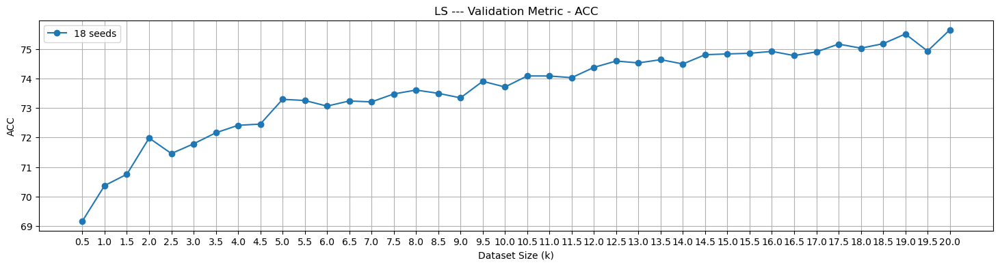

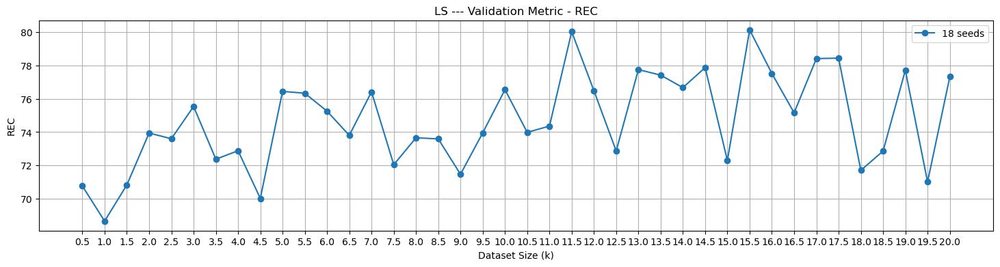

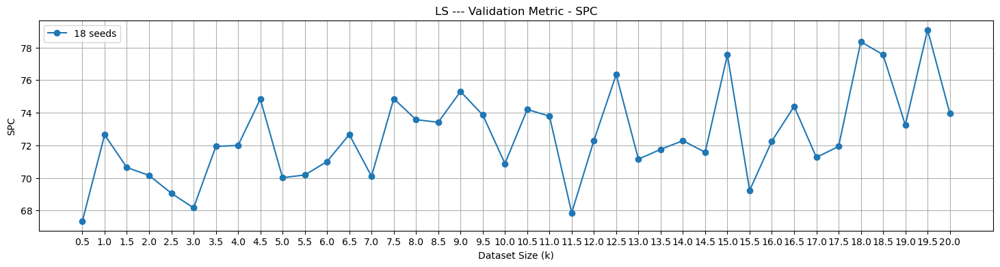

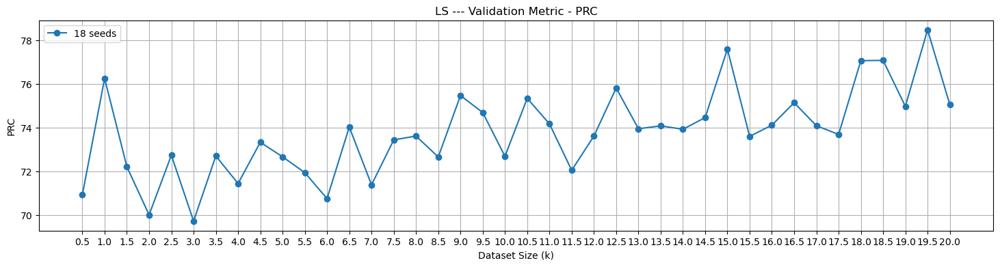

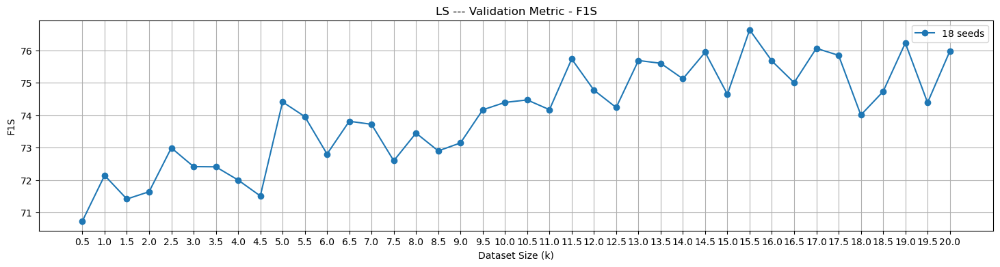

...

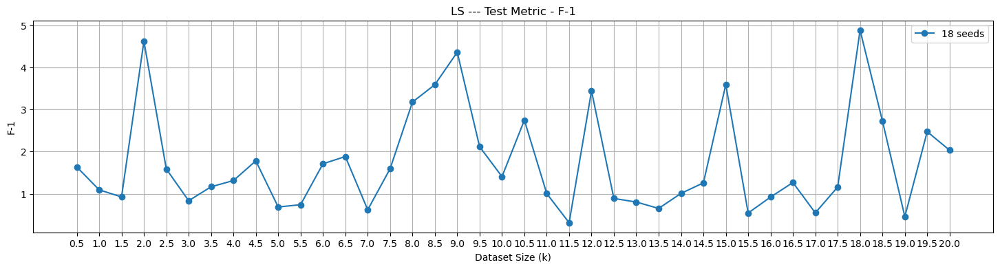

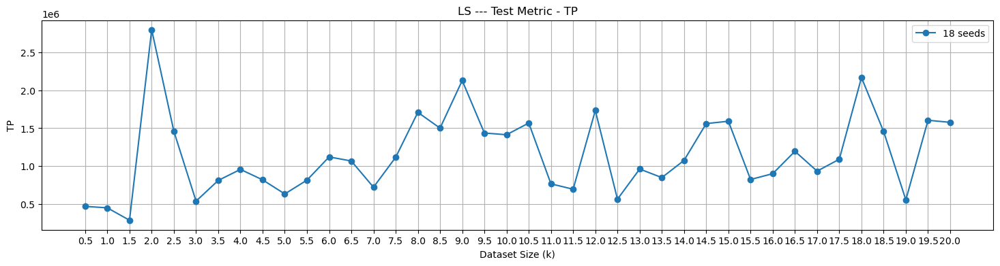

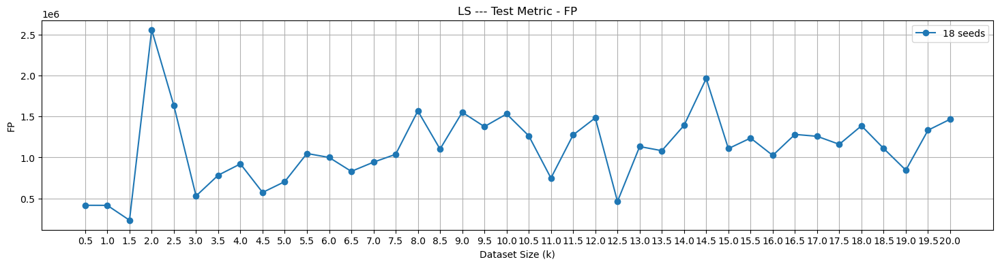

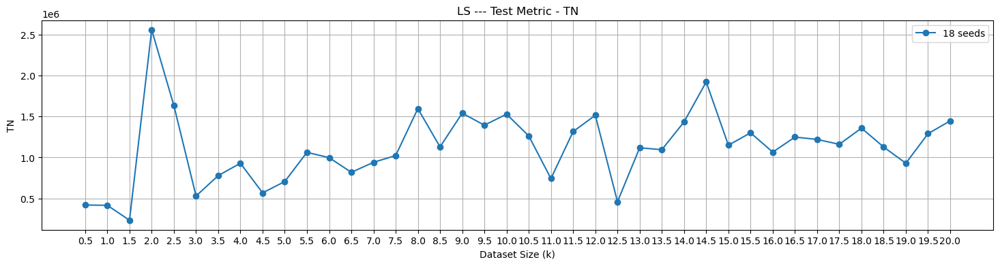

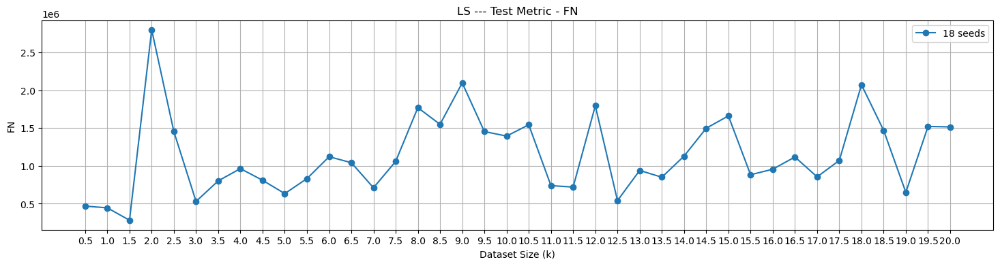

Average and Variance of each metric at each dataset size over 18 seeds (including all CUDA files):

--- VAL METRICS ---

Metric: ACC
Dataset Size: 0.5k, Avg: 69.1667, Var: 18.5833
Dataset Size: 1.0k, Avg: 70.3704, Var: 11.0202
Dataset Size: 1.5k, Avg: 70.7528, Var: 6.2658
Dataset Size: 2.0k, Avg: 71.9815, Var: 4.7335
Dataset Size: 2.5k, Avg: 71.4556, Var: 4.0377
Dataset Size: 3.0k, Avg: 71.7843, Var: 2.9100
Dataset Size: 3.5k, Avg: 72.1594, Var: 2.3652
Dataset Size: 4.0k, Avg: 72.4119, Var: 1.5613
Dataset Size: 4.5k, Avg: 72.4541, Var: 1.6484
Dataset Size: 5.0k, Avg: 73.2926, Var: 1.2374
Dataset Size: 5.5k, Avg: 73.2541, Var: 1.9083
Dataset Size: 6.0k, Avg: 73.0633, Var: 1.7325
Dataset Size: 6.5k, Avg: 73.2376, Var: 1.0884
Dataset Size: 7.0k, Avg: 73.2061, Var: 1.4371
Dataset Size: 7.5k, Avg: 73.4756, Var: 1.3437
Dataset Size: 8.0k, Avg: 73.6070, Var: 0.9775
Dataset Size: 8.5k, Avg: 73.4969, Var: 1.9527
Dataset Size: 9.0k, Avg: 73.3428, Var: 1.2709
Dataset Size: 9.5k, Avg: 73.9043, Var

In [33]:
### READ & PLOT LS

# List of files to read along with their identifiers
files = {
    "cuda0": "Dataset_NOSEEN_LS_Investment_Log_cuda0.txt",
    "cuda1": "Dataset_NOSEEN_LS_Investment_Log_cuda1.txt",
    "cuda2": "Dataset_NOSEEN_LS_Investment_Log_cuda2.txt",
}

# Initialize the main dictionary to hold data from all files
LS_main_data_dict = {}
for cuda_id, filename in files.items():
    with open(filename, 'r') as f:
        lines = f.readlines()

    # Initialize the dictionary for this file
    data_dict = {}

    # Initialize variables
    current_dataset_size = None
    current_seed = None
    current_BS = None
    current_ES = None
    current_NS = None
    val_metrics = {}
    test_metrics = {}
    test_subsets = []
    train_time = None
    test_time = None
    state = 'OUTSIDE'
    i = 0
    while i < len(lines):
        line = lines[i].strip()
        # Detect the start of a new record
        if '==================== Train:' in line:
            # If there's previous data, store it
            if current_dataset_size and current_seed is not None:
                if current_dataset_size not in data_dict:
                    data_dict[current_dataset_size] = {}
                if current_seed not in data_dict[current_dataset_size]:
                    data_dict[current_dataset_size][current_seed] = {}

                data_dict[current_dataset_size][current_seed]['BS'] = current_BS
                data_dict[current_dataset_size][current_seed]['ES'] = current_ES
                data_dict[current_dataset_size][current_seed]['NS'] = current_NS
                data_dict[current_dataset_size][current_seed]['val_metrics'] = val_metrics
                data_dict[current_dataset_size][current_seed]['test_metrics'] = test_metrics
                data_dict[current_dataset_size][current_seed]['test_subsets'] = test_subsets
                # Save the Train/Test Time:
                data_dict[current_dataset_size][current_seed]['Train_T'] = train_time
                data_dict[current_dataset_size][current_seed]['Test_T'] = test_time

            # Reset variables for new record
            current_BS = None
            current_ES = None
            current_NS = None
            train_time = None
            test_time = None
            val_metrics = {}
            test_metrics = {}
            test_subsets = []
            state = 'OUTSIDE'

            # Extract dataset size and seed
            m = re.search(r'own_data/LS_Hm_(.+)_seed(\d+)_11.npy', line)
            if m:
                current_dataset_size = m.group(1)
                current_seed = int(m.group(2))  # Convert seed to integer
            else:
                current_dataset_size = None
                current_seed = None
        elif '===== Number of Seen Proteins' in line:
            # Extract BS, ES, NS
            m = re.search(r'BS: ([\d\.]+)  \|  ES: ([\d\.]+)  \|  NS: ([\d\.]+)', line)
            if m:
                current_BS = float(m.group(1))
                current_ES = float(m.group(2))
                current_NS = float(m.group(3))
        elif 'VALIDATION SET METRICS' in line:
            state = 'IN_VAL_METRICS'
            # Skip the next line if it's empty
            i += 1
            while i < len(lines) and lines[i].strip() == '':
                i += 1
            # Read headers
            headers = re.findall(r'\S+', lines[i].strip())
            # Skip separator line
            i += 2
            # Read data line
            data_line = lines[i].strip()
            data_values = re.findall(r'[\d\.\-]+', data_line)
            data_values = [float(v) for v in data_values]
            val_metrics = dict(zip(headers, data_values))
            state = 'OUTSIDE'
        elif 'TEST SET METRICS' in line:
            state = 'IN_TEST_METRICS'
            # Skip the next line if it's empty
            i += 1
            while i < len(lines) and lines[i].strip() == '':
                i += 1
            # Read headers
            headers = re.findall(r'\S+', lines[i].strip())
            # Skip separator line
            i += 2
            # Read data line
            data_line = lines[i].strip()
            data_values = re.findall(r'[\d\.\-]+', data_line)
            data_values = [float(v) for v in data_values]
            test_metrics = dict(zip(headers, data_values))
            # Now, read the subset metrics
            # Skip empty lines until we reach the subset headers
            i += 1
            while i < len(lines) and (lines[i].strip() == '' or '>>>>>Time' in lines[i]): # To handle >>>>>Time errors
                if '>>>>>Time' in lines[i]:
                    # print(current_dataset_size,current_seed)
                    train_time = float(re.findall(r'[\d\.\-]+', lines[i].strip())[0])
                    i += 1
                    test_time = float(re.findall(r'[\d\.\-]+', lines[i].strip())[0])
                    # print(train_time,test_time)
                i += 1
            if i < len(lines):
                subset_header_line = lines[i].strip()
                subset_headers = re.findall(r'\S+', subset_header_line)
                # Read the next three lines as data
                for _ in range(3):
                    i += 1
                    data_line = lines[i].strip()
                    data_values = re.findall(r'[\d\.\-]+', data_line)
                    data_values = [float(v) for v in data_values]
                    subset_metrics = dict(zip(subset_headers, data_values))
                    test_subsets.append(subset_metrics)
            state = 'OUTSIDE'
        else:
            
            pass
        i += 1
    # After processing all lines, store the last record
    if current_dataset_size and current_seed is not None:
        if current_dataset_size not in data_dict:
            data_dict[current_dataset_size] = {}
        if current_seed not in data_dict[current_dataset_size]:
            data_dict[current_dataset_size][current_seed] = {}

        data_dict[current_dataset_size][current_seed]['BS'] = current_BS
        data_dict[current_dataset_size][current_seed]['ES'] = current_ES
        data_dict[current_dataset_size][current_seed]['NS'] = current_NS
        data_dict[current_dataset_size][current_seed]['val_metrics'] = val_metrics
        data_dict[current_dataset_size][current_seed]['test_metrics'] = test_metrics
        data_dict[current_dataset_size][current_seed]['test_subsets'] = test_subsets
        # Save the Train/Test Time:
        data_dict[current_dataset_size][current_seed]['Train_T'] = train_time
        data_dict[current_dataset_size][current_seed]['Test_T'] = test_time
        
    # Store the data_dict for this file into the LS_main_data_dict
    LS_main_data_dict[cuda_id] = data_dict



# Now, collect metrics data for plotting and calculations
# Initialize metrics_data
metrics_data = {
    'val': {},  # metrics_data['val'][dataset_size][metric_name][seed][cuda_id] = value
    'test': {}  # metrics_data['test'][dataset_size][metric_name][seed][cuda_id] = value
}

# Collect metrics across all CUDA files
for cuda_id, data_dict in LS_main_data_dict.items():
    for dataset_size, seeds_dict in data_dict.items():
        if dataset_size not in metrics_data['val']:
            metrics_data['val'][dataset_size] = {}
            metrics_data['test'][dataset_size] = {}
        for seed, metrics_dict in seeds_dict.items():
            val_metrics = metrics_dict['val_metrics']
            test_metrics = metrics_dict['test_metrics']
            for metric_name, value in val_metrics.items():
                if metric_name == 'F1S':
                    # print(metric_name)
                    # print(value)
                    rec = metrics_data['val'][dataset_size]['REC'][seed][cuda_id]
                    prc = metrics_data['val'][dataset_size]['PRC'][seed][cuda_id]
                    value = 2*(rec*prc)/(rec+prc)
                    # print(value)
                if metric_name not in metrics_data['val'][dataset_size]:
                    metrics_data['val'][dataset_size][metric_name] = {}
                if seed not in metrics_data['val'][dataset_size][metric_name]:
                    metrics_data['val'][dataset_size][metric_name][seed] = {}
                metrics_data['val'][dataset_size][metric_name][seed][cuda_id] = value
            for metric_name, value in test_metrics.items():
                if metric_name not in metrics_data['test'][dataset_size]:
                    metrics_data['test'][dataset_size][metric_name] = {}
                if seed not in metrics_data['test'][dataset_size][metric_name]:
                    metrics_data['test'][dataset_size][metric_name][seed] = {}
                metrics_data['test'][dataset_size][metric_name][seed][cuda_id] = value

pprint.pprint(LS_main_data_dict)

# Now, calculate averages for each metric at each dataset size over varying numbers of seeds
metrics_avg = {
    'val': {},
    'test': {}
}
metrics_var = {
    'val': {},
    'test': {}
}

num_seeds_list = [18]
seeds_list = [126, 119, 112, 105, 98, 91, 84, 77, 70, 63, 56, 49, 42, 35, 28, 21, 14, 7]

for metric_type in ['val', 'test']:
    for dataset_size in metrics_data[metric_type]:
        for metric_name in metrics_data[metric_type][dataset_size]:
            if metric_name not in metrics_avg[metric_type]:
                metrics_avg[metric_type][metric_name] = {}
                metrics_var[metric_type][metric_name] = {}
            if dataset_size not in metrics_avg[metric_type][metric_name]:
                metrics_avg[metric_type][metric_name][dataset_size] = {}
                metrics_var[metric_type][metric_name][dataset_size] = {}
            for num_seeds in num_seeds_list:
                selected_seeds = seeds_list[:num_seeds]
                values = []
                for seed in selected_seeds:
                    if seed in metrics_data[metric_type][dataset_size][metric_name]:
                        for cuda_id in metrics_data[metric_type][dataset_size][metric_name][seed]:
                            value = metrics_data[metric_type][dataset_size][metric_name][seed][cuda_id]
                            values.append(value)
                if values:
                    avg_value = sum(values) / len(values)
                    var_value = sum((x - avg_value) ** 2 for x in values) / len(values)
                    metrics_avg[metric_type][metric_name][dataset_size][num_seeds] = avg_value
                    metrics_var[metric_type][metric_name][dataset_size][num_seeds] = var_value
                else:
                    # If no values are found, set avg and var to None
                    metrics_avg[metric_type][metric_name][dataset_size][num_seeds] = None
                    metrics_var[metric_type][metric_name][dataset_size][num_seeds] = None

# Now, plot the averages for each metric over varying numbers of seeds
def plot_metrics(metrics_avg, metric_type, title_prefix):
    for metric_name in metrics_avg[metric_type]:
        dataset_sizes = sorted(metrics_avg[metric_type][metric_name].keys(), key=lambda x: float(x.replace('k', '')))
        x_values = [float(ds.replace('k', '')) for ds in dataset_sizes]
        plt.figure(figsize=(18, 4))
        for num_seeds in num_seeds_list:
            y_values = []
            for ds in dataset_sizes:
                avg_value = metrics_avg[metric_type][metric_name][ds].get(num_seeds, None)
                y_values.append(avg_value)
            plt.plot(x_values, y_values, marker='o', label=f'{num_seeds} seeds')
        plt.title(f'{title_prefix} {metric_name}')
        plt.xlabel('Dataset Size (k)')
        plt.ylabel(metric_name)
        plt.grid(True)
        plt.xticks(x_values)
        plt.legend()
        plt.show()

### SAVE THE MTERICS TO L/LS
LS_metrics_avg = metrics_avg
LS_metrics_var = metrics_var

# Plot validation metrics
plot_metrics(LS_metrics_avg, 'val', 'LS --- Validation Metric -')
# Plot test metrics
plot_metrics(LS_metrics_var, 'test', 'LS --- Test Metric -')

# Now, print the average and variance of each metric at each dataset size over 18 seeds
selected_num_seeds = 18
print("Average and Variance of each metric at each dataset size over 18 seeds (including all CUDA files):\n")
for metric_type in ['val', 'test']:
    print(f"--- {metric_type.upper()} METRICS ---")
    for metric_name in LS_metrics_avg[metric_type]:
        print(f"\nMetric: {metric_name}")
        for dataset_size in sorted(LS_metrics_avg[metric_type][metric_name].keys(), key=lambda x: float(x.replace('k', ''))):
            avg_value = LS_metrics_avg[metric_type][metric_name][dataset_size][selected_num_seeds]
            var_value = LS_metrics_var[metric_type][metric_name][dataset_size][selected_num_seeds]
            print(f"Dataset Size: {dataset_size}, Avg: {avg_value:.4f}, Var: {var_value:.4f}")

In [ ]:
import pprint

pprint.pprint(LS_main_data_dict)

## S VS LS METRICS Compare

In [ ]:
### PLOT METRICS COMPARE

from matplotlib.ticker import MaxNLocator

def plot_comp_metrics(S_metrics_avg, LS_metrics_avg, metric_type, title_prefix):
    for metric_name in S_metrics_avg[metric_type]:
        dataset_sizes = sorted(LS_metrics_avg[metric_type][metric_name].keys(), key=lambda x: float(x.replace('k', '')))
        x_values = [float(ds.replace('k', '')) for ds in dataset_sizes]
        plt.figure(figsize=(10, 3))
        for num_seeds in num_seeds_list:
            S_y_values, LS_y_values = [], []
            for ds in dataset_sizes:
                S_avg_value = S_metrics_avg[metric_type][metric_name][ds][num_seeds]
                # print(num_seeds)
                LS_avg_value = LS_metrics_avg[metric_type][metric_name][ds][num_seeds]
                # print(metric_type)
                # print(LS_metrics_avg['test'])
                # print(LS_avg_value)
                S_y_values.append(S_avg_value)
                LS_y_values.append(LS_avg_value)
            # print(LS_y_values)
            plt.plot(x_values, S_y_values, marker='o', markersize=3, label=f'S')
            plt.plot(x_values, LS_y_values, marker='o', markersize=3, label=f'LS')


            ### Write the values
            # for i, (x, y) in enumerate(zip(x_values, S_y_values)):
            #     if y is not None:
            #         plt.text(x, y, f'{y:.1f}', fontsize=10, ha='left')
            # for i, (x, y) in enumerate(zip(x_values, LS_y_values)):
            #     if y is not None:
            #         plt.text(x, y, f'{y:.1f}', fontsize=10, ha='left')

    # for metric_name in LS_metrics_avg[metric_type]:
    #     print(metric_name)
    #     dataset_sizes = sorted(LS_metrics_avg[metric_type][metric_name].keys(), key=lambda x: float(x.replace('k', '')))
    #     x_values = [float(ds.replace('k', '')) for ds in dataset_sizes]
    #     # plt.figure(figsize=(18, 4))
    #     for num_seeds in num_seeds_list:
    #         y_values = []
    #         for ds in dataset_sizes:
    #             avg_value = LS_metrics_avg[metric_type][metric_name][ds].get(num_seeds, None)
    #             y_values.append(avg_value)
    #         plt.plot(x_values, y_values, marker='o', label=f'LS')

        plt.title(f'{title_prefix} {metric_name}')
        plt.xlabel('Dataset Size (k)')
        plt.ylabel(metric_name)
        # plt.grid(True)
        plt.xticks(x_values[::2])
        plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
        plt.legend()
        plt.show()

# Plot validation metrics
plot_comp_metrics(S_metrics_avg, LS_metrics_avg, 'val', 'Comp --- Val -')
# Plot test metrics
plot_comp_metrics(S_metrics_avg, LS_metrics_avg, 'test', 'Comp --- Test -')

# Subsets Plot (Testset)

In [ ]:
### READ BS/ES/NS

### S PART ###

subsets_data = {
    'BS': {},
    'ES': {},
    'NS': {}   # subsets_data['BS'][dataset_size][metric_name][seed][cuda_id] = value
}

# Collect metrics across all CUDA files
for cuda_id, data_dict in S_main_data_dict.items():
    for dataset_size, seeds_dict in data_dict.items():
        if dataset_size not in subsets_data['BS']:
            subsets_data['BS'][dataset_size] = {}
            subsets_data['ES'][dataset_size] = {}
            subsets_data['NS'][dataset_size] = {}
        for seed, metrics_dict in seeds_dict.items():
            BS_metrics = metrics_dict['test_subsets'][0]
            ES_metrics = metrics_dict['test_subsets'][1]
            NS_metrics = metrics_dict['test_subsets'][2]
            for metric_name, value in BS_metrics.items():
                # if metric_name == 'F1S':
                    # print(metric_name)
                    # print(value)
                    # rec = subsets_data['BS'][dataset_size]['REC'][seed][cuda_id]
                    # prc = subsets_data['BS'][dataset_size]['PRC'][seed][cuda_id]
                    # value = 2*(rec*prc)/(rec+prc)
                    # print(value)
                if metric_name not in subsets_data['BS'][dataset_size]:
                    subsets_data['BS'][dataset_size][metric_name] = {}
                if seed not in subsets_data['BS'][dataset_size][metric_name]:
                    subsets_data['BS'][dataset_size][metric_name][seed] = {}
                subsets_data['BS'][dataset_size][metric_name][seed][cuda_id] = value
            for metric_name, value in ES_metrics.items():
                if metric_name not in subsets_data['ES'][dataset_size]:
                    subsets_data['ES'][dataset_size][metric_name] = {}
                if seed not in subsets_data['ES'][dataset_size][metric_name]:
                    subsets_data['ES'][dataset_size][metric_name][seed] = {}
                subsets_data['ES'][dataset_size][metric_name][seed][cuda_id] = value
            for metric_name, value in NS_metrics.items():
                if metric_name not in subsets_data['NS'][dataset_size]:
                    subsets_data['NS'][dataset_size][metric_name] = {}
                if seed not in subsets_data['NS'][dataset_size][metric_name]:
                    subsets_data['NS'][dataset_size][metric_name][seed] = {}
                subsets_data['NS'][dataset_size][metric_name][seed][cuda_id] = value

# print(subsets_data)

# Now, calculate averages for each metric at each dataset size over varying numbers of seeds
metrics_avg = {
    'BS': {},
    'ES': {},
    'NS': {}
}
metrics_var = {
    'BS': {},
    'ES': {},
    'NS': {}
}

num_seeds_list = [18]
seeds_list = [126, 119, 112, 105, 98, 91, 84, 77, 70, 63, 56, 49, 42, 35, 28, 21, 14, 7]

for metric_subset in ['BS','ES','NS']:
    for dataset_size in subsets_data[metric_subset]:
        for metric_name in subsets_data[metric_subset][dataset_size]:
            if metric_name not in metrics_avg[metric_subset]:
                metrics_avg[metric_subset][metric_name] = {}
                metrics_var[metric_subset][metric_name] = {}
            if dataset_size not in metrics_avg[metric_subset][metric_name]:
                metrics_avg[metric_subset][metric_name][dataset_size] = {}
                metrics_var[metric_subset][metric_name][dataset_size] = {}
            for num_seeds in num_seeds_list:
                selected_seeds = seeds_list[:num_seeds]
                values = []
                for seed in selected_seeds:
                    if seed in subsets_data[metric_subset][dataset_size][metric_name]:
                        for cuda_id in subsets_data[metric_subset][dataset_size][metric_name][seed]:
                            value = subsets_data[metric_subset][dataset_size][metric_name][seed][cuda_id]
                            values.append(value)
                if values:
                    avg_value = sum(values) / len(values)
                    var_value = sum((x - avg_value) ** 2 for x in values) / len(values)
                    metrics_avg[metric_subset][metric_name][dataset_size][num_seeds] = avg_value
                    metrics_var[metric_subset][metric_name][dataset_size][num_seeds] = var_value
                else:
                    # If no values are found, set avg and var to None
                    metrics_avg[metric_subset][metric_name][dataset_size][num_seeds] = None
                    metrics_var[metric_subset][metric_name][dataset_size][num_seeds] = None


print(metrics_avg)
# Save
S_metrics_avg_SUB = metrics_avg
S_metrics_var = metrics_var

### LS PART ###

subsets_data = {
    'BS': {},
    'ES': {},
    'NS': {}   # subsets_data['BS'][dataset_size][metric_name][seed][cuda_id] = value
}

# Collect metrics across all CUDA files
for cuda_id, data_dict in LS_main_data_dict.items():
    for dataset_size, seeds_dict in data_dict.items():
        if dataset_size not in subsets_data['BS']:
            subsets_data['BS'][dataset_size] = {}
            subsets_data['ES'][dataset_size] = {}
            subsets_data['NS'][dataset_size] = {}
        for seed, metrics_dict in seeds_dict.items():
            BS_metrics = metrics_dict['test_subsets'][0]
            ES_metrics = metrics_dict['test_subsets'][1]
            NS_metrics = metrics_dict['test_subsets'][2]
            for metric_name, value in BS_metrics.items():
                # if metric_name == 'F1S':
                    # print(metric_name)
                    # print(value)
                    # rec = subsets_data['BS'][dataset_size]['REC'][seed][cuda_id]
                    # prc = subsets_data['BS'][dataset_size]['PRC'][seed][cuda_id]
                    # value = 2*(rec*prc)/(rec+prc)
                    # print(value)
                if metric_name not in subsets_data['BS'][dataset_size]:
                    subsets_data['BS'][dataset_size][metric_name] = {}
                if seed not in subsets_data['BS'][dataset_size][metric_name]:
                    subsets_data['BS'][dataset_size][metric_name][seed] = {}
                subsets_data['BS'][dataset_size][metric_name][seed][cuda_id] = value
            for metric_name, value in ES_metrics.items():
                if metric_name not in subsets_data['ES'][dataset_size]:
                    subsets_data['ES'][dataset_size][metric_name] = {}
                if seed not in subsets_data['ES'][dataset_size][metric_name]:
                    subsets_data['ES'][dataset_size][metric_name][seed] = {}
                subsets_data['ES'][dataset_size][metric_name][seed][cuda_id] = value
            for metric_name, value in NS_metrics.items():
                if metric_name not in subsets_data['NS'][dataset_size]:
                    subsets_data['NS'][dataset_size][metric_name] = {}
                if seed not in subsets_data['NS'][dataset_size][metric_name]:
                    subsets_data['NS'][dataset_size][metric_name][seed] = {}
                subsets_data['NS'][dataset_size][metric_name][seed][cuda_id] = value

# print(subsets_data)


# Now, calculate averages for each metric at each dataset size over varying numbers of seeds
metrics_avg = {
    'BS': {},
    'ES': {},
    'NS': {}
}
metrics_var = {
    'BS': {},
    'ES': {},
    'NS': {}
}

num_seeds_list = [18]
seeds_list = [126, 119, 112, 105, 98, 91, 84, 77, 70, 63, 56, 49, 42, 35, 28, 21, 14, 7]

for metric_subset in ['BS','ES','NS']:
    for dataset_size in subsets_data[metric_subset]:
        for metric_name in subsets_data[metric_subset][dataset_size]:
            if metric_name not in metrics_avg[metric_subset]:
                metrics_avg[metric_subset][metric_name] = {}
                metrics_var[metric_subset][metric_name] = {}
            if dataset_size not in metrics_avg[metric_subset][metric_name]:
                metrics_avg[metric_subset][metric_name][dataset_size] = {}
                metrics_var[metric_subset][metric_name][dataset_size] = {}
            for num_seeds in num_seeds_list:
                selected_seeds = seeds_list[:num_seeds]
                values = []
                for seed in selected_seeds:
                    if seed in subsets_data[metric_subset][dataset_size][metric_name]:
                        for cuda_id in subsets_data[metric_subset][dataset_size][metric_name][seed]:
                            value = subsets_data[metric_subset][dataset_size][metric_name][seed][cuda_id]
                            values.append(value)
                if values:
                    avg_value = sum(values) / len(values)
                    var_value = sum((x - avg_value) ** 2 for x in values) / len(values)
                    metrics_avg[metric_subset][metric_name][dataset_size][num_seeds] = avg_value
                    metrics_var[metric_subset][metric_name][dataset_size][num_seeds] = var_value
                else:
                    # If no values are found, set avg and var to None
                    metrics_avg[metric_subset][metric_name][dataset_size][num_seeds] = None
                    metrics_var[metric_subset][metric_name][dataset_size][num_seeds] = None


print(metrics_avg)
# Save
LS_metrics_avg_SUB = metrics_avg
LS_metrics_var = metrics_var

print(S_metrics_avg_SUB)
print(LS_metrics_avg_SUB)


## PLOTTING

def plot_comp_metrics(S_metrics_avg_SUB, LS_metrics_avg_SUB, metric_type, title_prefix):
    for metric_name in LS_metrics_avg_SUB[metric_type]:
        dataset_sizes = sorted(S_metrics_avg_SUB[metric_type][metric_name].keys(), key=lambda x: float(x.replace('k', '')))
        x_values = [float(ds.replace('k', '')) for ds in dataset_sizes]
        plt.figure(figsize=(18, 4))
        for num_seeds in num_seeds_list:
            S_y_values, LS_y_values = [], []
            for ds in dataset_sizes:
                S_avg_value = S_metrics_avg_SUB[metric_type][metric_name][ds][num_seeds]
                LS_avg_value = LS_metrics_avg_SUB[metric_type][metric_name][ds][num_seeds]
                S_y_values.append(S_avg_value)
                LS_y_values.append(LS_avg_value)
            plt.plot(x_values, S_y_values, marker='o', label=f'S')
            plt.plot(x_values, LS_y_values, marker='o', label=f'LS')

            for i, (x, y) in enumerate(zip(x_values, S_y_values)):
                if y is not None:
                    plt.text(x, y, f'{y:.1f}', fontsize=10, ha='left')
            for i, (x, y) in enumerate(zip(x_values, LS_y_values)):
                if y is not None:
                    plt.text(x, y, f'{y:.1f}', fontsize=10, ha='left')

        plt.title(f'{title_prefix} {metric_name}')
        plt.xlabel('Dataset Size (k)')
        plt.ylabel(metric_name)
        plt.grid(True)
        plt.xticks(x_values)
        plt.legend()
        plt.show()


# print(LS_metrics_avg_SUB['BS']['TP']['1.5k'][18] + LS_metrics_avg_SUB['BS']['FP']['0.5k'][18] + LS_metrics_avg_SUB['BS']['TN']['0.5k'][18] + LS_metrics_avg_SUB['BS']['FN']['0.5k'][18])


# # Plot BS metrics
# plot_comp_metrics(S_metrics_avg_SUB, LS_metrics_avg_SUB, 'BS', 'Comp --- BS Metric -')
# # Plot ES metrics
# plot_comp_metrics(S_metrics_avg_SUB, LS_metrics_var, 'ES', 'Comp --- ES Metric -')
# # Plot ES metrics
# plot_comp_metrics(S_metrics_avg_SUB, LS_metrics_var, 'NS', 'LS --- NS Metric -')

# # Now, print the average and variance of each metric at each dataset size over 18 seeds
# selected_num_seeds = 18
# print("Average and Variance of each metric at each dataset size over 18 seeds (including all CUDA files):\n")
# for metric_subset in ['BS', 'ES']:

In [ ]:
S_main_data_dict

In [ ]:
### PLOT

import numpy as np

# Takes S_main_data_dict and LS_main_data_dict as Input

# Helper function to convert datasize strings to float for sorting
def datasize_to_float(s):
    return float(s.rstrip('k'))

# Extract cudas, datasizes, and seeds from the data dictionaries
def get_keys(main_data_dict):
    cudas = list(main_data_dict.keys())
    datasizes = list(main_data_dict[cudas[0]].keys())
    seeds = list(main_data_dict[cudas[0]][datasizes[0]].keys())
    return cudas, datasizes, seeds

# Initialize data structures
def initialize_metrics_data(datasizes, metrics_list):
    metrics_data = {'BS': {}, 'ES': {}, 'NS': {}}
    for subset in metrics_data:
        for datasize in datasizes:
            metrics_data[subset][datasize] = {}
            for metric in metrics_list:
                metrics_data[subset][datasize][metric] = []
    return metrics_data

# Collect metrics from the main data dictionary
def collect_metrics(main_data_dict, cudas, datasizes, seeds, metrics_data, subset_names, metrics_list):
    for cuda in cudas:
        for datasize in datasizes:
            for seed in seeds:
                try:
                    test_subsets = main_data_dict[cuda][datasize][seed]['test_subsets']
                    for i, subset_metrics in enumerate(test_subsets):
                        subset_name = subset_names[i]
                        for metric in metrics_list:
                            value = subset_metrics.get(metric)
                            if value is not None:
                                metrics_data[subset_name][datasize][metric].append(value)
                            else:
                                print(test_subsets,'IS NONE!')
                                print(cuda,datasize,seed,'IS NONE!')
                                pass
                except KeyError:
                    print(1)
                    pass  # Handle missing data gracefully
    return metrics_data

# Compute averages and variances
def compute_stats(metrics_data, datasizes, metrics_list):
    metrics_stats = {'BS': {}, 'ES': {}, 'NS': {}}
    for subset in metrics_stats:
        for datasize in datasizes:
            metrics_stats[subset][datasize] = {}
            for metric in metrics_list:
                values = metrics_data[subset][datasize][metric]
                if values:
                    avg = np.mean(values)
                    var = np.var(values)
                else:
                    avg = None
                    var = None
                metrics_stats[subset][datasize][metric] = {'mean': avg, 'var': var}
    return metrics_stats

# Plot the graphs
def plot_metrics(metrics_stats_S, metrics_stats_LS, sorted_datasizes, metrics_list):
    for subset in ['BS', 'ES', 'NS']:
        full_name_dict = {'BS':'Both Seen', 'ES':'Either Seen', 'NS':'None Seen', 'ACC':'Accuracy', 'REC':'Recall', 'SPE':'Specificity', 'PRE':'Precision', 'F1S':'F1-Score'}
        full_name = full_name_dict[subset]
        num_metrics = len(metrics_list)

        if subset == 'BS':
            alp = 'A.'
        elif subset == 'ES':
            alp = 'B.'
        else:
            alp = 'C.'

        fig, axs = plt.subplots(num_metrics, 1, figsize=(7, num_metrics * 2.1))
        fig.suptitle(r"$\mathbf{" + alp.replace(" ", "\ ") + "}$" + f" Metrics of " + r"$\mathbf{" + full_name.replace(" ", "\ ") + "}$" + " Proteins", fontsize=22)
        
        for idx, metric in enumerate(metrics_list):
            ax = axs[idx] if num_metrics > 1 else axs
            x_vals = []
            y_S_vals = []
            y_LS_vals = []
            for ds in sorted_datasizes:
                x_val = datasize_to_float(ds)
                y_S = metrics_stats_S[subset][ds][metric]['mean']
                y_LS = metrics_stats_LS[subset][ds][metric]['mean']
                if y_S is not None and y_LS is not None:
                    x_vals.append(x_val)
                    y_S_vals.append(y_S)
                    y_LS_vals.append(y_LS)
            ax.plot(x_vals, y_S_vals, marker='o', markersize=3, label='Short Protein Trainset')
            ax.plot(x_vals, y_LS_vals, marker='o', markersize=3, label='Mixed Protein Trainset')
            if idx == len(metrics_list)-1:
                ax.set_xlabel('Train Dataset Size (k)', fontsize=15)
            metric = full_name_dict[metric]
            # ax.set_ylabel(f'{metric} (%)')
            # ax.set_xticks(np.arange(min(x_vals)-0.5, max(x_vals)+0.5, 2))  # min(Step) size for the subplot
            ax.set_title(metric)
            ax.yaxis.set_major_locator(MaxNLocator(integer=True, nbins=5))
            # ax.set_ylim(bottom=50)
            ax.legend()
            ax.grid(False)
        plt.tight_layout()
        plt.subplots_adjust(hspace=0.37, top=0.9)
        plt.show()

# Main execution
def main(S_main_data_dict, LS_main_data_dict):
    # Define the subset names and metrics
    subset_names = {0: 'BS', 1: 'ES', 2: 'NS'}
    metrics_list = ['ACC', 'REC', 'PRE', 'F1S']  #['ACC', 'REC', 'SPE', 'PRE', 'F1S']

    # Extract keys from the data dictionaries
    cudas, datasizes, seeds = get_keys(S_main_data_dict)
    # print(datasizes)

    # Sort datasizes
    sorted_datasizes = sorted(datasizes, key=datasize_to_float)
    # print(sorted_datasizes)

    # Initialize metrics data structures
    metrics_data_S = initialize_metrics_data(sorted_datasizes, metrics_list)
    metrics_data_LS = initialize_metrics_data(sorted_datasizes, metrics_list)
    # pprint.pprint(metrics_data_LS)

    # Collect metrics from both data dictionaries
    metrics_data_S = collect_metrics(S_main_data_dict, cudas, sorted_datasizes, seeds, metrics_data_S, subset_names, metrics_list)
    metrics_data_LS = collect_metrics(LS_main_data_dict, cudas, sorted_datasizes, seeds, metrics_data_LS, subset_names, metrics_list)
    pprint.pprint(metrics_data_LS)

    # Compute averages and variances
    metrics_stats_S = compute_stats(metrics_data_S, sorted_datasizes, metrics_list)
    metrics_stats_LS = compute_stats(metrics_data_LS, sorted_datasizes, metrics_list)

    # Plot the graphs
    plot_metrics(metrics_stats_S, metrics_stats_LS, sorted_datasizes, metrics_list)

# Main
main(S_main_data_dict, LS_main_data_dict)


In [ ]:
LS_main_data_dict

In [ ]:
### PLOT SUBSETS Initial Version (without dots)

# Assuming S_main_data_dict and LS_main_data_dict are provided
# Example:
# S_main_data_dict = {...}
# LS_main_data_dict = {...}

# Helper function to convert datasize strings to float for sorting
def datasize_to_float(s):
    return float(s.rstrip('k'))

# Extract cudas, datasizes, and seeds from the data dictionaries
def get_keys(main_data_dict):
    cudas = list(main_data_dict.keys())
    datasizes = list(main_data_dict[cudas[0]].keys())
    seeds = list(main_data_dict[cudas[0]][datasizes[0]].keys())
    return cudas, datasizes, seeds

# Initialize data structures
def initialize_metrics_data(datasizes, metrics_list):
    metrics_data = {'BS': {}, 'ES': {}, 'NS': {}}
    for subset in metrics_data:
        for datasize in datasizes:
            metrics_data[subset][datasize] = {}
            for metric in metrics_list:
                metrics_data[subset][datasize][metric] = []
    return metrics_data

# Collect metrics from the main data dictionary
def collect_metrics(main_data_dict, cudas, datasizes, seeds, metrics_data, subset_names, metrics_list):
    for cuda in cudas:
        for datasize in datasizes:
            for seed in seeds:
                try:
                    test_subsets = main_data_dict[cuda][datasize][seed]['test_subsets']
                    for i, subset_metrics in enumerate(test_subsets):
                        subset_name = subset_names[i]
                        for metric in metrics_list:
                            value = subset_metrics.get(metric)
                            if value is not None:
                                metrics_data[subset_name][datasize][metric].append(value)
                except KeyError:
                    pass  # Handle missing data gracefully
    return metrics_data

# Compute averages and variances
def compute_stats(metrics_data, datasizes, metrics_list):
    metrics_stats = {'BS': {}, 'ES': {}, 'NS': {}}
    for subset in metrics_stats:
        for datasize in datasizes:
            metrics_stats[subset][datasize] = {}
            for metric in metrics_list:
                values = metrics_data[subset][datasize][metric]
                if values:
                    avg = np.mean(values)
                    var = np.var(values)
                else:
                    avg = None
                    var = None
                metrics_stats[subset][datasize][metric] = {'mean': avg, 'var': var}
    return metrics_stats

# Plot the graphs
def plot_metrics(metrics_stats_S, metrics_stats_LS, sorted_datasizes, metrics_list):
    for subset in ['BS', 'ES', 'NS']:
        num_metrics = len(metrics_list)
        fig, axs = plt.subplots(num_metrics, 1, figsize=(10, num_metrics * 3))
        fig.suptitle(f'Metrics for subset {subset}', fontsize = 16)
        for idx, metric in enumerate(metrics_list):
            ax = axs[idx] if num_metrics > 1 else axs
            x_vals = []
            y_S_vals = []
            y_LS_vals = []
            for ds in sorted_datasizes:
                x_val = datasize_to_float(ds)
                y_S = metrics_stats_S[subset][ds][metric]['mean']
                y_LS = metrics_stats_LS[subset][ds][metric]['mean']
                if y_S is not None and y_LS is not None:
                    x_vals.append(x_val)
                    y_S_vals.append(y_S)
                    y_LS_vals.append(y_LS)
            ax.plot(x_vals, y_S_vals, label='S_main_data_dict')
            ax.plot(x_vals, y_LS_vals, label='LS_main_data_dict')
            ax.set_xlabel('Datasize (k)')
            ax.set_ylabel(metric)
            ax.set_title(metric)
            ax.legend()
            # ax.grid(True)
        plt.tight_layout()
        plt.subplots_adjust(hspace=0.35, top=0.94)
        plt.show()

# Main execution
def main(S_main_data_dict, LS_main_data_dict):
    # Define the subset names and metrics
    subset_names = {0: 'BS', 1: 'ES', 2: 'NS'}
    metrics_list = ['ACC', 'REC', 'SPE', 'PRE', 'F1S']

    # Extract keys from the data dictionaries
    cudas, datasizes, seeds = get_keys(S_main_data_dict)

    # Sort datasizes
    sorted_datasizes = sorted(datasizes, key=datasize_to_float)

    # Initialize metrics data structures
    metrics_data_S = initialize_metrics_data(sorted_datasizes, metrics_list)
    metrics_data_LS = initialize_metrics_data(sorted_datasizes, metrics_list)

    # Collect metrics from both data dictionaries
    metrics_data_S = collect_metrics(S_main_data_dict, cudas, sorted_datasizes, seeds, metrics_data_S, subset_names, metrics_list)
    metrics_data_LS = collect_metrics(LS_main_data_dict, cudas, sorted_datasizes, seeds, metrics_data_LS, subset_names, metrics_list)

    # Compute averages and variances
    metrics_stats_S = compute_stats(metrics_data_S, sorted_datasizes, metrics_list)
    metrics_stats_LS = compute_stats(metrics_data_LS, sorted_datasizes, metrics_list)

    # Plot the graphs
    plot_metrics(metrics_stats_S, metrics_stats_LS, sorted_datasizes, metrics_list)

# Example usage:
# S_main_data_dict = {...}  # Your S_main_data_dict data here
# LS_main_data_dict = {...}  # Your LS_main_data_dict data here
main(S_main_data_dict, LS_main_data_dict)


# Subsets Plot(Avg)

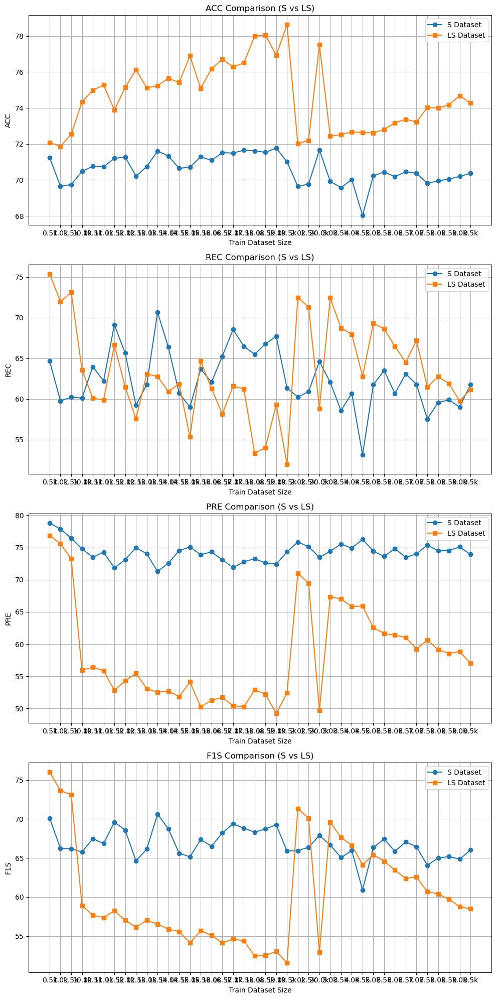

In [29]:
### TAKE AVG & PLOT

def extract_and_plot_s_vs_ls(s_data, ls_data, metrics):
    """
    Compare S and LS datasets by averaging BS, ES, and NS subsets and plotting metrics.

    Args:
        s_data (dict): Data dictionary for the S dataset.
        ls_data (dict): Data dictionary for the LS dataset.
        metrics (list): List of metrics to extract and plot.

    Returns:
        None: Generates and displays the plots.
    """
    # Extract the list of train dataset sizes
    train_sizes = sorted(next(iter(s_data.values())).keys())

    # Initialize dictionaries to hold averages
    s_avg_metrics = {metric: [] for metric in metrics}
    ls_avg_metrics = {metric: [] for metric in metrics}

    # Loop through train sizes and calculate averages
    for size in train_sizes:
        s_metrics_at_size = {metric: [] for metric in metrics}
        ls_metrics_at_size = {metric: [] for metric in metrics}

        # Collect metrics for S
        for gpu, seeds in s_data.items():
            if size in seeds:
                for seed_id, seed_data in seeds[size].items():
                    for subset in seed_data['test_subsets']:
                        for metric in metrics:
                            s_metrics_at_size[metric].append(subset[metric])
        
        # Collect metrics for LS
        for gpu, seeds in ls_data.items():
            if size in seeds:
                for seed_id, seed_data in seeds[size].items():
                    for subset in seed_data['test_subsets']:
                        for metric in metrics:
                            ls_metrics_at_size[metric].append(subset[metric])

        # Compute averages for S and LS
        for metric in metrics:
            s_avg_metrics[metric].append(np.mean(s_metrics_at_size[metric]))
            ls_avg_metrics[metric].append(np.mean(ls_metrics_at_size[metric]))

    # Plot the metrics
    fig, axes = plt.subplots(len(metrics), 1, figsize=(10, 5 * len(metrics)))
    if len(metrics) == 1:
        axes = [axes]  # Ensure axes is iterable for a single metric

    for i, metric in enumerate(metrics):
        axes[i].plot(train_sizes, s_avg_metrics[metric], label="S Dataset", marker='o')
        axes[i].plot(train_sizes, ls_avg_metrics[metric], label="LS Dataset", marker='s')
        axes[i].set_title(f"{metric} Comparison (S vs LS)")
        axes[i].set_xlabel("Train Dataset Size")
        axes[i].set_ylabel(metric)
        axes[i].legend()
        axes[i].grid()

    plt.tight_layout()
    plt.show()

# Specify metrics to plot
metrics_to_plot = ['ACC', 'REC', 'PRE', 'F1S']  # Adjust metrics as needed

# Call the function with your S and LS datasets
extract_and_plot_s_vs_ls(S_main_data_dict, LS_main_data_dict, metrics_to_plot)

# Train Time

In [ ]:
### PLOT TIME - without excluding Test Time

# Data for the bar graph
categories = ['Average Datasize = 4k', 'Average Datasize = 10k']
short = [25.88/1.4, 33.81]  # Values for the first pair of bars
Lshort = [37.90/1.4, 49.89]  # Values for the second pair of bars

# Bar width and position for each pair
bar_width = 0.34
x = np.arange(len(categories))  # x locations for the categories

# Create the bar plot
fig, ax = plt.subplots(figsize=(6, 8))
bars1 = ax.bar(x - bar_width / 2, short, width=bar_width, label='Short Proteins Trainset')
bars2 = ax.bar(x + bar_width / 2, Lshort, width=bar_width, label='Mixed Proteins Trainset')

# Add labels, title, and legend
ax.set_xlabel('Trainset Sizes',fontsize= 14)
ax.set_ylabel('Train Time (hours)')
ax.set_title('Train Time of Short vs. Mixed Protein Trainset',fontsize= 14)
ax.set_xticks(x)
ax.set_xticklabels(categories)
ax.legend(loc="upper left")

# Add text above each bar
for bar in bars1:
    yval = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, yval+0.5, f'{round(yval, 1)} hr', ha='center', va='bottom', fontsize=14)

for bar in bars2:
    yval = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, yval+1.5, f'{round(yval, 1)} hr', ha='center', va='bottom', fontsize=14)

# Adjust x-axis limits to make the pairs closer
plt.xlim(-0.5, len(categories) - 0.5)
plt.ylim(top=60)

# Show the plot
plt.show()

## Plot more time with more sample points

In [ ]:
pprint.pprint(S_main_data_dict)

In [ ]:
# plt.plot(10, 33.8/49.9*16, label='LS', marker='o')

# plt.plot(4, 17, label='LS', marker='o')
import numpy as np
import matplotlib.pyplot as plt

def compute_averages_and_variances(data_dict):
    # Extract and sort datasizes by removing the 'k' suffix and converting to float
    datasizes = [1.5, 4.5, 10.5, 12.0, 15.5, 16.0, 16.5, 17.0]

    averages = []
    variances = []

    for datasize in datasizes:
        train_t_values = []

        for device in data_dict.values():
            datasize_key = f"{datasize}k"
            if datasize_key in device:
                for seed in device[datasize_key].values():
                    train_t = seed.get('Train_T')
                    if train_t is not None:  # Skip None values
                        train_t_values.append(train_t)

        if train_t_values:  # Only calculate if there are valid values
            average = np.mean(train_t_values)
            variance = np.var(train_t_values)
        else:  # If no valid values, set average and variance to None
            average = None
            variance = None

        averages.append(average)
        variances.append(variance)

    return datasizes, averages, variances

# Compute averages and variances for both dictionaries
S_datasizes, S_averages, S_variances = compute_averages_and_variances(S_main_data_dict)
LS_datasizes, LS_averages, LS_variances = compute_averages_and_variances(LS_main_data_dict)

S_averages_min = []
LS_averages_min = []

for S_average in S_averages:
    S_average /= 60
    S_averages_min.append(S_average)

for LS_average in LS_averages:
    LS_average /= 60
    LS_averages_min.append(LS_average)

# Ensure datasizes match between the two datasets (assume both have the same datasizes)
assert S_datasizes == LS_datasizes, "Datasizes do not match between the two dictionaries."


# Plot the values
plt.figure(figsize=(7, 3.8))
plt.plot(S_datasizes, S_averages_min, label='S')
plt.plot(LS_datasizes, LS_averages_min, label='LS')
plt.xlabel('Datasize (k)', fontdict={'fontname': 'Times New Roman', 'fontsize': 14, 'fontweight': 'bold'})
plt.ylabel('Average Time (min)', fontdict={'fontname': 'Times New Roman', 'fontsize': 12, 'fontweight': 'bold'})
plt.xticks([2, 6, 9, 13, 16])
plt.ylim([1.2, 37])
plt.title('Train Time for S & LS', fontdict={'fontname': 'Times New Roman', 'fontsize': 14.5, 'fontweight': 'bold'})
plt.grid()
plt.legend()
plt.show()

# Print the averages and variances for S_main_data_dict
print("S_main_data_dict Averages and Variances:")
for datasize, avg, var in zip(S_datasizes, S_averages, S_variances):
    print(f"Datasize: {datasize}k, Average Train_T: {avg}, Variance: {var}")

# Print the averages and variances for LS_main_data_dict
print("\nLS_main_data_dict Averages and Variances:")
for datasize, avg, var in zip(LS_datasizes, LS_averages, LS_variances):
    print(f"Datasize: {datasize}k, Average Train_T: {avg}, Variance: {var}")

# Figure 2 A

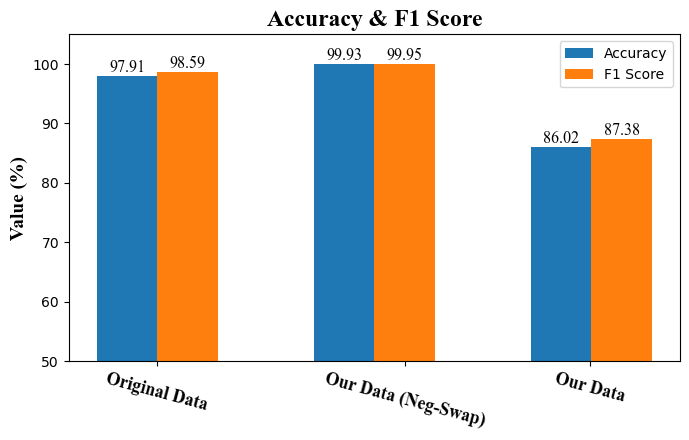

In [31]:
import matplotlib.pyplot as plt

# Data
categories = [
    "Original Data", 
    "Our Data (Neg-Swap)", 
    "Our Data"
]
accuracy = [97.91, 99.93, 86.02]
f1_score = [98.59, 99.95, 87.38]

# Bar width and positions
bar_width = 0.28
x = range(len(categories))

# Plot
fig, ax = plt.subplots(figsize=(7, 4.5))
bars1 = ax.bar(x, accuracy, width=bar_width, label='Accuracy', align='center')
bars2 = ax.bar([i + bar_width for i in x], f1_score, width=bar_width, label='F1 Score', align='center')

# Adding values on top of the bars
for bar in bars1:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2.0, height, f'{height:.2f}', ha='center', va='bottom', 
            fontdict={'fontname': 'Times New Roman', 'fontsize': 11.6})
for bar in bars2:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2.0, height, f'{height:.2f}', ha='center', va='bottom', 
            fontdict={'fontname': 'Times New Roman', 'fontsize': 11.6})

# Labels and title
ax.set_ylabel("Value (%)", fontdict={'fontname': 'Times New Roman', 'fontsize': 14, 'fontweight': 'bold'})
ax.set_title("Accuracy & F1 Score", fontdict={'fontname': 'Times New Roman', 'fontsize': 17, 'fontweight': 'bold'})

# Adjust x-ticks slightly to the right
ax.set_xticks([0.138,1.28,2.135])  # Adjusted to shift right
ax.set_xticklabels(categories, rotation=-15, fontdict={'fontname': 'Times New Roman', 'fontsize': 12.82, 'fontweight': 'bold'})
ax.set_ylim([50, 105])
ax.legend()

# Show plot
plt.tight_layout()
plt.show()

# Finetune Compare

In [ ]:
### Extract the FineTune Data

import re
import numpy as np
from collections import defaultdict

def parse_log_file(log_file_path):
    # Initialize variables
    all_blocks = []
    current_block = {}
    state = None  # Can be 'validation', 'test', 'subset'

    with open(log_file_path, 'r') as f:
        lines = f.readlines()

    i = 0
    while i < len(lines):
        line = lines[i].strip()

        # Check for new block
        if '============================' in line:
            if current_block:
                all_blocks.append(current_block)
                current_block = {}
            i += 1
            continue

        # Extract Pre-Train Dataset Size
        if 'Pre-Train Dataset Size:' in line:
            match = re.search(r'Pre-Train Dataset Size:\s*([\d\.]+)', line)
            if match:
                current_block['pretrain_size'] = float(match.group(1))
            i += 1
            continue

        # Extract Finetune dataset size and random seed
        if 'Train:' in line:
            match = re.search(r'Train:\s*(\S+)', line)
            if match:
                train_filename = match.group(1)
                # Extract finetune size and seed from filename
                # Assuming filename format: own_data/LS_Hm_<finetune_size>k_seed<seed>_11.npy
                fname = train_filename.split('/')[-1]
                fname_match = re.match(r'LS_Hm_([\d\.]+)k_seed(\d+)_\d+\.npy', fname)
                if fname_match:
                    current_block['finetune_size'] = float(fname_match.group(1))
                    current_block['seed'] = int(fname_match.group(2))
            i += 1
            continue

        # Start parsing validation metrics
        if 'VALIDATION SET METRICS' in line:
            state = 'validation'
            i += 1  # Move to the next line, which should be the header
            while i < len(lines) and lines[i].strip() == '':
                i += 1  # Skip empty lines
            header_line = lines[i].strip()
            validation_headers = header_line.split()
            i += 1  # Move to the dashed line or values
            while i < len(lines) and ('-' in lines[i] or lines[i].strip() == ''):
                i += 1  # Skip dashed lines and empty lines
            values_line = lines[i].strip()
            validation_values = [float(v) for v in values_line.split()]
            current_block['validation_metrics'] = dict(zip(validation_headers, validation_values))
            state = None
            i += 1
            continue

        # Start parsing test metrics
        if 'TEST SET METRICS' in line:
            state = 'test'
            i += 1  # Move to the next line, which should be the header
            while i < len(lines) and lines[i].strip() == '':
                i += 1  # Skip empty lines
            header_line = lines[i].strip()
            test_headers = header_line.split()
            i += 1  # Move to the dashed line or values
            while i < len(lines) and ('-' in lines[i] or lines[i].strip() == ''):
                i += 1  # Skip dashed lines and empty lines
            values_line = lines[i].strip()
            test_values = [float(v) for v in values_line.split()]
            current_block['test_metrics'] = dict(zip(test_headers, test_values))
            state = None
            i += 1
            continue

        # Start parsing subset metrics
        if re.match(r'\s*TP\s+FP\s+TN\s+FN\s+ACC\s+REC\s+SPE\s+PRE\s+F1S', line):
            state = 'subset'
            subset_headers = line.strip().split()
            subsets = ['Both Seen', 'Either Seen', 'None Seen']
            subset_metrics = {}
            for subset in subsets:
                i += 1
                while i < len(lines) and lines[i].strip() == '':
                    i += 1  # Skip empty lines
                if i >= len(lines):
                    break
                values_line = lines[i].strip()
                values = [float(v) for v in values_line.split()]
                subset_metrics[subset] = dict(zip(subset_headers, values))
            current_block['subset_metrics'] = subset_metrics
            state = None
            i += 1
            continue

        i += 1  # Move to the next line

    # Append the last block if not empty
    if current_block:
        all_blocks.append(current_block)

    # Organize the data and compute averages over seeds
    # Create a nested dictionary: data[pretrain_size][finetune_size] = list of metrics
    data = {}
    for block in all_blocks:
        pretrain_size = block.get('pretrain_size')
        finetune_size = block.get('finetune_size')
        seed = block.get('seed')

        if pretrain_size is None or finetune_size is None or seed is None:
            continue  # Skip incomplete blocks

        key = (pretrain_size, finetune_size)
        if key not in data:
            data[key] = defaultdict(list)

        # Collect metrics
        data[key]['validation_metrics'].append(block.get('validation_metrics'))
        data[key]['test_metrics'].append(block.get('test_metrics'))
        data[key]['subset_metrics'].append(block.get('subset_metrics'))

    # Compute averages over seeds
    averaged_data = {}
    for key, metrics in data.items():
        pretrain_size, finetune_size = key
        averaged_data.setdefault(pretrain_size, {})
        averaged_data[pretrain_size].setdefault(finetune_size, {})

        # Average validation metrics
        val_metrics_list = metrics['validation_metrics']
        if val_metrics_list:
            avg_val_metrics = {}
            for metric in val_metrics_list[0]:
                avg_val_metrics[metric] = np.mean([m[metric] for m in val_metrics_list])
            averaged_data[pretrain_size][finetune_size]['validation_metrics'] = avg_val_metrics

        # Average test metrics
        test_metrics_list = metrics['test_metrics']
        if test_metrics_list:
            avg_test_metrics = {}
            for metric in test_metrics_list[0]:
                avg_test_metrics[metric] = np.mean([m[metric] for m in test_metrics_list])
            averaged_data[pretrain_size][finetune_size]['test_metrics'] = avg_test_metrics

        # Average subset metrics
        subset_metrics_list = metrics['subset_metrics']
        if subset_metrics_list:
            avg_subset_metrics = {}
            subsets = ['Both Seen', 'Either Seen', 'None Seen']
            for subset in subsets:
                avg_subset = {}
                for metric in subset_metrics_list[0][subset]:
                    avg_subset[metric] = np.mean([m[subset][metric] for m in subset_metrics_list])
                avg_subset_metrics[subset] = avg_subset
            averaged_data[pretrain_size][finetune_size]['subset_metrics'] = avg_subset_metrics

    return averaged_data, data

# Example usage:
finetune_averaged_metrics, finetune_org_data = parse_log_file('Dataset_finetuneLOG3.txt')

import pprint

pprint.pprint(finetune_averaged_metrics)
# pprint.pprint(finetune_org_data)

In [ ]:
### PLOTTING

metrics_to_plot = ['F-1', 'ACC', 'AUPRC', 'REC', 'SPC', 'PRC']  # Adjust to your needs
for metric in metrics_to_plot:
    try:        
### PLOT

        import matplotlib.pyplot as plt

        # Assume these dicts are already defined:
        # finetune_averaged_metrics and LS_metrics_avg

        # Let's say we want to focus on test_metrics 'ACC' or 'F-1'
        primary_metric = metric  # or 'F-1' from finetune_averaged_metrics and LS_metrics_avg
                            # Make sure to match the exact keys ('F-1' or 'F1S')
                            # In finetune_averaged_metrics, it's 'F-1' in test_metrics
                            # In LS_metrics_avg, also 'F-1'. Adjust if needed.

        ##############################
        # Extract from-scratch data
        ##############################
        # LS_metrics_avg structure:
        # LS_metrics_avg['test'][metric][size_str] = {18: value} 
        # e.g. LS_metrics_avg['test']['ACC']['0.5k'][18] = 67.96018518518521

        from_scratch_data = {}
        for size_str, val_dict in LS_metrics_avg['test'][primary_metric].items():
            # size_str like '1.0k'
            # Extract the numeric value
            # val_dict is something like {18: value}, just take the value
            key_epoch = list(val_dict.keys())[0]
            metric_value = val_dict[key_epoch]
            
            # Convert '1.0k' to a float representing total size
            # remove 'k', convert to float
            total_size = float(size_str.replace('k',''))
            from_scratch_data[total_size] = metric_value

        ##############################
        # Extract pretrain+finetune data
        ##############################
        # finetune_averaged_metrics structure:
        # {pretrain_short: {finetune_SL: { 'test_metrics': { 'ACC': val, 'F-1': val, ...}, ... }}}

        # Create a nested dict:
        # pretrain_finetune_data[total_size][pretrain_short_size] = (finetune_size, metric_value)
        pretrain_finetune_data = {}
        for pretrain_short_size, finetune_dict in finetune_averaged_metrics.items():
            for finetune_SL_size, metrics_dict in finetune_dict.items():
                # total size
                total_size = pretrain_short_size + finetune_SL_size
                test_value = metrics_dict['test_metrics'][primary_metric]

                if total_size not in pretrain_finetune_data:
                    pretrain_finetune_data[total_size] = {}
                pretrain_finetune_data[total_size][pretrain_short_size] = (finetune_SL_size, test_value)

        ##############################
        # Plot the data
        ##############################

        # Sort total sizes for plotting
        sorted_total_sizes = sorted(set(from_scratch_data.keys()) | set(pretrain_finetune_data.keys()))

        fig, ax = plt.subplots(figsize=(10,6))

        # Plot from scratch line
        fs_x = sorted(from_scratch_data.keys())
        fs_y = [from_scratch_data[x] for x in fs_x]
        ax.plot(fs_x, fs_y, label='From Scratch (Short+Long)', color='black', linewidth=2)

        # Plot each pretrain scenario
        # For each pretrain short size, we will gather points across various total sizes
        pretrain_short_sizes = sorted(set(s for d in pretrain_finetune_data.values() for s in d.keys()))

        # Different colors for different pretrain sizes
        colors = plt.cm.viridis(np.linspace(0,1,len(pretrain_short_sizes)))

        for color, p_size in zip(colors, pretrain_short_sizes):
            # Collect data points for this pretrain size across total sizes
            p_x, p_y = [], []
            for t_size in sorted_total_sizes:
                if t_size in pretrain_finetune_data and p_size in pretrain_finetune_data[t_size]:
                    _, val = pretrain_finetune_data[t_size][p_size]
                    p_x.append(t_size)
                    p_y.append(val)
            # Plot this line
            ax.plot(p_x, p_y, marker='o', color=color, label=f'Pretrain {p_size}k short + Finetune', alpha=0.8)

        ax.set_xlabel('Total Training Size (k proteins)')
        ax.set_ylabel(primary_metric)
        ax.set_title(f'Comparison of Pretrain+Finetune vs From Scratch: {primary_metric}')
        ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.tight_layout()
        plt.show()

        ##############################
        # Optional: Plot difference (improvement) charts
        ##############################
        # Compute improvement over from scratch:
        fig2, ax2 = plt.subplots(figsize=(10,6))

        for color, p_size in zip(colors, pretrain_short_sizes):
            p_x, p_y = [], []
            for t_size in sorted_total_sizes:
                if t_size in pretrain_finetune_data and p_size in pretrain_finetune_data[t_size] and t_size in from_scratch_data:
                    _, val = pretrain_finetune_data[t_size][p_size]
                    improvement = val - from_scratch_data[t_size]
                    p_x.append(t_size)
                    p_y.append(improvement)
            ax2.plot(p_x, p_y, marker='o', color=color, label=f'Pretrain {p_size}k + Finetune Improvement', alpha=0.8)

        ax2.axhline(0, color='black', linewidth=2)  # baseline line
        ax2.set_xlabel('Total Training Size (k proteins)')
        ax2.set_ylabel(f'Improvement in {primary_metric}')
        ax2.set_title(f'Improvement Over From Scratch ({primary_metric})')
        ax2.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.tight_layout()
        plt.show()
    except:
        print(f'SKIPPED {metric}')

# LS~S 4 Experiments

In [ ]:
### READING & AVERAGING S_S

# 4 Results:  S:S + S:LS + LS:S + LS:LS
import re
import matplotlib.pyplot as plt
from collections import defaultdict
import os

# Define the list of LOG files
files = {
    "cuda0": "Dataset_TEMP_Log_cuda0.txt",
    "cuda1": "Dataset_TEMP_Log_cuda1.txt",
    "cuda2": "Dataset_TEMP_Log_cuda2.txt",
    "cuda3": "Dataset_TEMP_Log_cuda3.txt",
}

# Define the range of dataset sizes (0.5k to 20.0k in 0.5k increments)
dataset_sizes = [f"{size}k" for size in [i * 0.5 for i in range(1, 41)]]  # 0.5k to 20.0k

# Initialize the main dictionary to hold data from all files
# Structure: main_data[cuda_id][dataset_size][seed][metric] = value
main_data = defaultdict(lambda: defaultdict(lambda: defaultdict(dict)))

def parse_log_file(cuda_id, filename):
    """
    Parses a single LOG file and updates the main_data dictionary.
    """
    if not os.path.isfile(filename):
        print(f"Warning: File {filename} does not exist. Skipping.")
        return

    with open(filename, 'r') as f:
        lines = f.readlines()

    # Initialize variables
    current_dataset_size = None
    current_seed = None
    test_metrics = {}
    state = 'OUTSIDE'
    i = 0
    while i < len(lines):
        line = lines[i].strip()

        # Detect the start of a new training record
        if '==================== Train:' in line:
            # Extract dataset size and seed from the Train line
            m = re.search(r'own_data/LS_Hm_(\d+\.?\d*)k_seed(\d+)_\d+\.npy', line)
            if m:
                current_dataset_size = f"{m.group(1)}k"
                current_seed = int(m.group(2))
            else:
                current_dataset_size = None
                current_seed = None
            # Reset test_metrics for the new record
            test_metrics = {}
            i += 1
            continue

        # Detect the Test line
        if '===================== Test :' in line:
            # Optionally, you can extract test dataset info here
            i += 1
            continue

        # Detect the line with Number of Seen Proteins
        if '===== Number of Seen Proteins' in line:
            # Optionally, extract BS, ES, NS if needed
            i += 1
            continue

        # Detect Validation Set Metrics
        if 'VALIDATION SET METRICS' in line:
            state = 'IN_VAL_METRICS'
            # Skip the next line if it's empty
            i += 1
            while i < len(lines) and lines[i].strip() == '':
                i += 1
            # Read headers
            if i < len(lines):
                headers = re.findall(r'\S+', lines[i].strip())
                i += 2  # Skip separator line
                # Read data line
                if i < len(lines):
                    data_line = lines[i].strip()
                    data_values = re.findall(r'[\d\.\-]+', data_line)
                    data_values = [float(v) for v in data_values]
                    val_metrics = dict(zip(headers, data_values))
            state = 'OUTSIDE'
            i += 1
            continue

        # Detect Test Set Metrics
        if 'TEST SET METRICS' in line:
            state = 'IN_TEST_METRICS'
            # Skip the next line if it's empty
            i += 1
            while i < len(lines) and lines[i].strip() == '':
                i += 1
            # Read headers
            if i < len(lines):
                headers = re.findall(r'\S+', lines[i].strip())
                i += 2  # Skip separator line
                # Read data line
                if i < len(lines):
                    data_line = lines[i].strip()
                    data_values = re.findall(r'[\d\.\-]+', data_line)
                    data_values = [float(v) for v in data_values]
                    test_metrics = dict(zip(headers, data_values))
            # After test metrics, there might be subset metrics which we can ignore
            state = 'OUTSIDE'
            # Store the test_metrics into main_data
            if current_dataset_size and current_seed is not None:
                for metric_name, value in test_metrics.items():
                    main_data[cuda_id][current_dataset_size][current_seed][metric_name] = value
            i += 1
            continue

        # Move to next line if none of the above
        i += 1

def aggregate_metrics(main_data):
    """
    Aggregates the metrics by averaging over seeds and CUDA devices for each dataset size.
    Returns a dictionary with averaged metrics and a summary of seeds and cudas used.
    """
    # Initialize the aggregated metrics dictionary
    LS_S_metrics_avg = defaultdict(dict)  # LS_S_metrics_avg[metric][dataset_size] = avg_value
    metric_set = set()

    # Summary dictionary to keep track of seeds and cudas used per dataset size
    summary = defaultdict(lambda: {"seeds": set(), "cudas": set()})

    # Iterate over all CUDA devices
    for cuda_id, datasets in main_data.items():
        for dataset_size, seeds in datasets.items():
            for seed, metrics in seeds.items():
                summary[dataset_size]["seeds"].add(seed)
                summary[dataset_size]["cudas"].add(cuda_id)
                for metric_name, value in metrics.items():
                    metric_set.add(metric_name)
                    if metric_name not in LS_S_metrics_avg:
                        LS_S_metrics_avg[metric_name] = {}
                    if dataset_size not in LS_S_metrics_avg[metric_name]:
                        LS_S_metrics_avg[metric_name][dataset_size] = []
                    LS_S_metrics_avg[metric_name][dataset_size].append(value)

    # Compute the average for each metric and dataset size
    LS_S_metrics_avg_final = defaultdict(dict)
    for metric in metric_set:
        for dataset_size in dataset_sizes:
            values = LS_S_metrics_avg[metric].get(dataset_size, [])
            if values:
                avg_value = sum(values) / len(values)
                LS_S_metrics_avg_final[metric][dataset_size] = avg_value
            else:
                LS_S_metrics_avg_final[metric][dataset_size] = None  # Handle missing data

    return LS_S_metrics_avg_final, summary

def plot_metrics(LS_S_metrics_avg):
    """
    Plots the averaged metrics over dataset sizes.
    """
    # Define colors and markers for better visualization
    colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k']
    markers = ['o', 's', '^', 'D', 'v', '>', '<']

    for metric_name, data in LS_S_metrics_avg.items():
        # Extract dataset sizes and corresponding averaged metric values
        x_values = []
        y_values = []
        for ds in sorted(data.keys(), key=lambda x: float(x.replace('k', ''))):
            if data[ds] is not None:
                x_values.append(float(ds.replace('k', '')))
                y_values.append(data[ds])

        if not x_values:
            print(f"No data available to plot for metric: {metric_name}")
            continue

        plt.figure(figsize=(12, 6))
        plt.plot(x_values, y_values, marker='o', linestyle='-', color='b')
        plt.title(f'LS-trained on LS, Tested on S - {metric_name}')
        plt.xlabel('Dataset Size (k)')
        plt.ylabel(metric_name)
        plt.grid(True)
        plt.xticks(x_values, rotation=45)
        plt.tight_layout()
        plt.show()

def print_summary(summary):
    """
    Prints the number of seeds and CUDA devices used for each dataset size.
    """
    print("Summary of Seeds and CUDA Devices used for each Dataset Size:\n")
    for ds in sorted(summary.keys(), key=lambda x: float(x.replace('k', ''))):
        num_seeds = len(summary[ds]["seeds"])
        num_cudas = len(summary[ds]["cudas"])
        seeds_list = sorted(summary[ds]["seeds"])
        cudas_list = sorted(summary[ds]["cudas"])
        print(f"Dataset Size: {ds}")
        print(f"  Number of Seeds: {num_seeds} (Seeds: {seeds_list})")
        print(f"  Number of CUDAs: {num_cudas} (CUDAs: {cudas_list})\n")

# Parse all LOG files
for cuda_id, filename in files.items():
    parse_log_file(cuda_id, filename)

# Aggregate the metrics
LS_S_metrics_avg, summary = aggregate_metrics(main_data)

# Plot the averaged metrics
plot_metrics(LS_S_metrics_avg)

# Print the summary of seeds and cudas used
print_summary(summary)

111


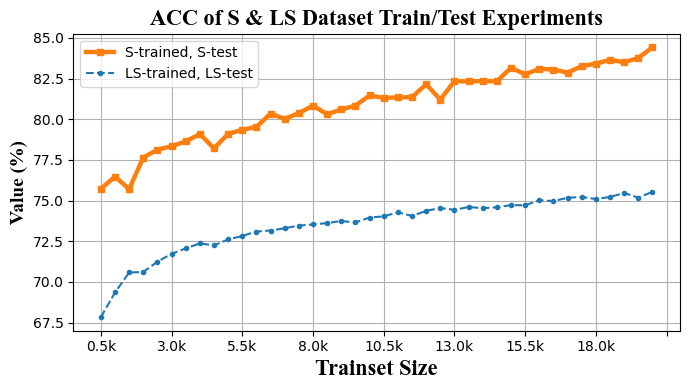

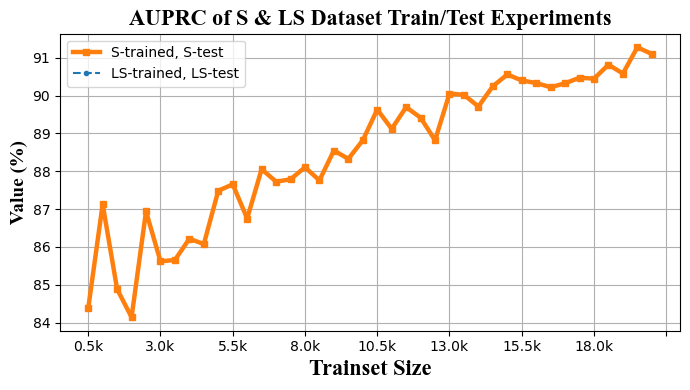

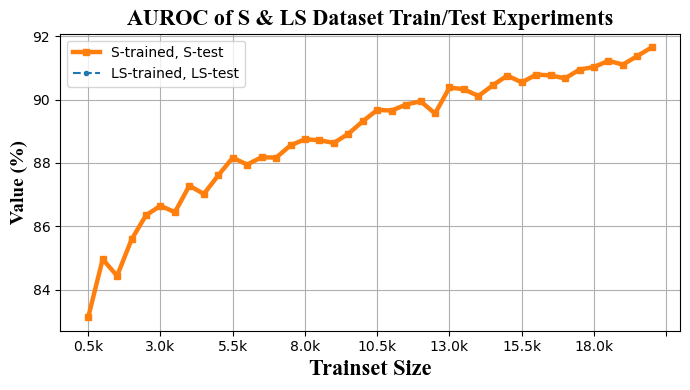

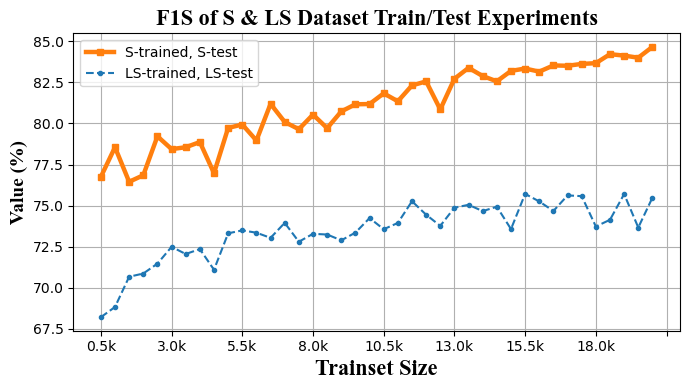

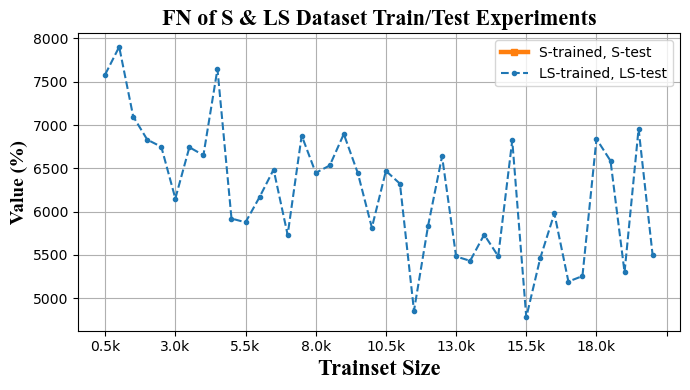

...

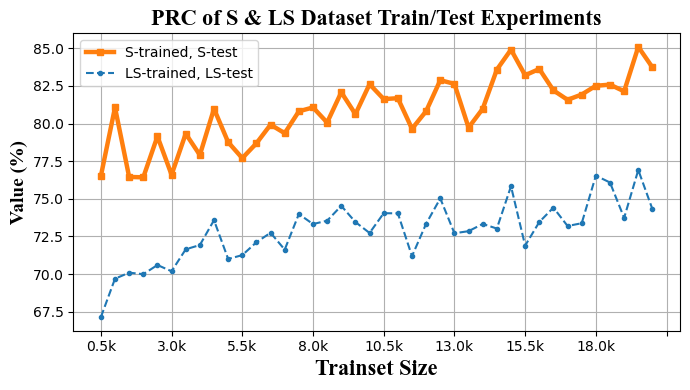

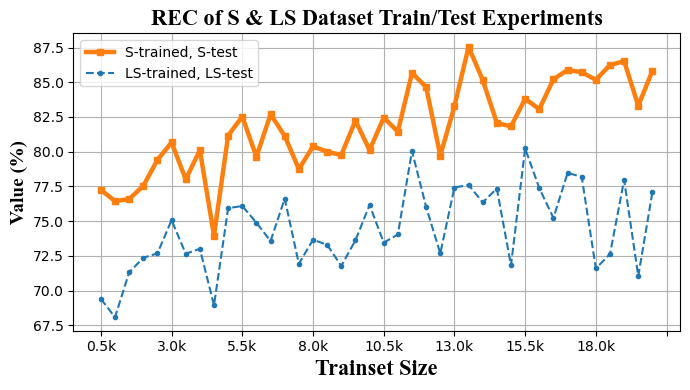

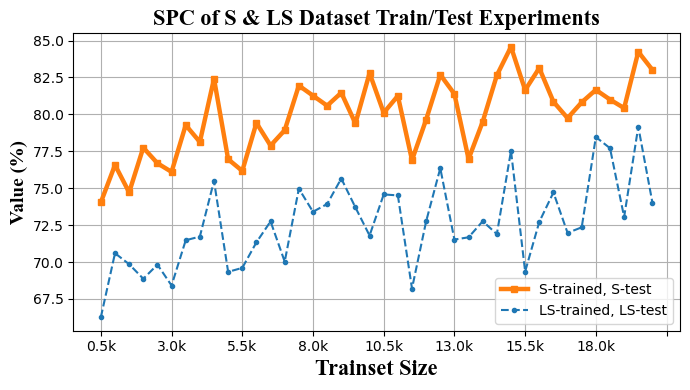

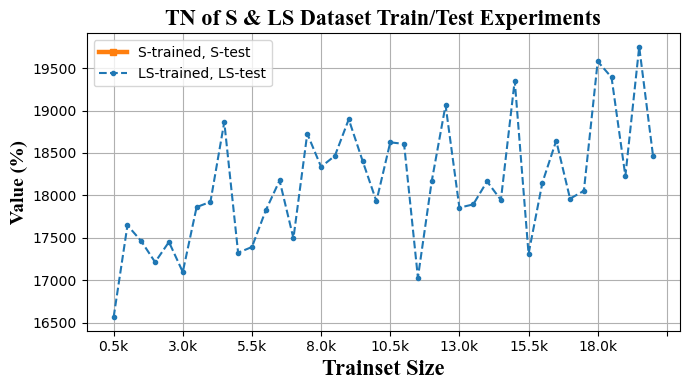

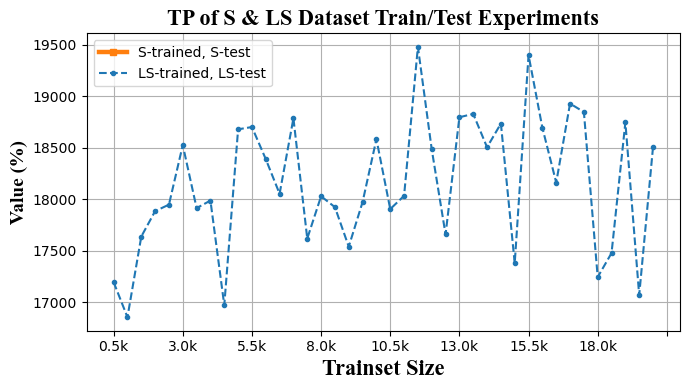

In [32]:
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
import numpy as np


# ------------------------------
# Function to Rename Metrics of F1Score
# ------------------------------
for metric_type in S_metrics_avg:
    for metric_name in list(S_metrics_avg[metric_type].keys()):
        # If the metric is 'F-1', replace it with 'F1S'
        if metric_name == "F1S":
            S_metrics_avg[metric_type]["F-1"] = S_metrics_avg[metric_type].pop(metric_name)
            print(111)

# ------------------------------
# Function to Average Metrics
# ------------------------------
def average_metrics(data_dict, subset):
    """
    Averages metrics over seeds for a given subset ('test' or 'val').

    Args:
        data_dict (dict): The metrics dictionary (S_metrics_avg or LS_metrics_avg).
        subset (str): The subset to process ('test' or 'val').

    Returns:
        dict: A dictionary with metrics as keys and dataset_sizes as sub-keys with averaged values.
    """
    averaged = {}
    subset_data = data_dict.get(subset, {})
    for metric, ds_dict in subset_data.items():
        averaged[metric] = {}
        for ds, seed_dict in ds_dict.items():
            values = list(seed_dict.values())
            if values:
                averaged[metric][ds] = sum(values) / len(values)
            else:
                averaged[metric][ds] = np.nan  # Use NaN for missing values
    return averaged

# ------------------------------
# Average S_metrics_avg and LS_metrics_avg
# ------------------------------
averaged_S_val_metrics = average_metrics(S_metrics_avg, 'val')
averaged_S_test_metrics = average_metrics(S_metrics_avg, 'test')
averaged_LS_test_metrics = average_metrics(LS_metrics_avg, 'test')

# ------------------------------
# Collect All Dataset Sizes
# ------------------------------
def collect_dataset_sizes(S_metrics_avg, LS_S_metrics_avg, LS_metrics_avg):
    """
    Collects all unique dataset sizes from the provided dictionaries.

    Args:
        S_metrics_avg (dict): The S_metrics_avg dictionary.
        LS_S_metrics_avg (dict): The LS_S_metrics_avg dictionary.
        LS_metrics_avg (dict): The LS_metrics_avg dictionary.

    Returns:
        list: Sorted list of unique dataset sizes.
    """
    dataset_sizes = set()

    # From S_metrics_avg
    for subset in ['test', 'val']:
        subset_data = S_metrics_avg.get(subset, {})
        for metric, ds_dict in subset_data.items():
            dataset_sizes.update(ds_dict.keys())

    # From LS_S_metrics_avg
    for metric, ds_dict in LS_S_metrics_avg.items():
        dataset_sizes.update(ds_dict.keys())

    # From LS_metrics_avg
    for subset in ['test', 'val']:
        subset_data = LS_metrics_avg.get(subset, {})
        for metric, ds_dict in subset_data.items():
            dataset_sizes.update(ds_dict.keys())

    # Convert to sorted list based on numeric value
    sorted_ds = sorted(dataset_sizes, key=lambda x: float(x.replace('k', '')))
    return sorted_ds

dataset_sizes = collect_dataset_sizes(S_metrics_avg, LS_S_metrics_avg, LS_metrics_avg)

# ------------------------------
# Extract Unique Metric Names
# ------------------------------
def extract_metric_names(S_metrics_avg, LS_S_metrics_avg, LS_metrics_avg):
    """
    Extracts unique metric names from the provided dictionaries.

    Args:
        S_metrics_avg (dict): The S_metrics_avg dictionary.
        LS_S_metrics_avg (dict): The LS_S_metrics_avg dictionary.
        LS_metrics_avg (dict): The LS_metrics_avg dictionary.

    Returns:
        list: Sorted list of unique metric names.
    """
    metric_names = set()

    # From S_metrics_avg
    for subset in ['test', 'val']:
        subset_data = S_metrics_avg.get(subset, {})
        metric_names.update(subset_data.keys())

    # From LS_S_metrics_avg
    metric_names.update(LS_S_metrics_avg.keys())

    # From LS_metrics_avg
    for subset in ['test', 'val']:
        subset_data = LS_metrics_avg.get(subset, {})
        metric_names.update(subset_data.keys())


    return sorted(metric_names)

metric_names = extract_metric_names(S_metrics_avg, LS_S_metrics_avg, LS_metrics_avg)

# ------------------------------
# Plotting Function
# ------------------------------
def plot_combined_metrics(averaged_S_val, averaged_S_test, LS_S_metrics_avg, averaged_LS_test, metric_names, dataset_sizes):
    """
    Plots the combined metrics on the same graph for comparison.

    Args:
        averaged_S_val (dict): Averaged validation metrics for S-trained models.
        averaged_S_test (dict): Averaged test metrics for S-trained models.
        LS_S_metrics_avg (dict): Metrics for LS-trained models tested on S-test.
        averaged_LS_test (dict): Averaged test metrics for LS-trained models.
        metric_names (list): List of unique metric names.
        dataset_sizes (list): Sorted list of dataset sizes.
    """
    # Define plotting styles
    plot_styles = {
        'S-trained, S-test': {'color': '#ff7f0e', 'marker': 's', 'linestyle': '-', 'label': 'S-trained, S-test'},
        'S-trained, LS-test': {'color': '#17becf', 'marker': 'o', 'linestyle': '--', 'label': 'S-trained, LS-test'},
        'LS-trained, S-test': {'color': '#2ca02c', 'marker': 'o', 'linestyle': '--', 'label': 'LS-trained, S-test'},
        'LS-trained, LS-test': {'color': '#1f77b4', 'marker': 'o', 'linestyle': '--', 'label': 'LS-trained, LS-test'},
    }


    for metric in metric_names:
        # ifelse is for handling F-1 names...
        if metric == 'F1S':
            pass
        else:            
            plt.figure(figsize=(7, 4))

            # 1. S-trained, S-test
            y_S_val = [averaged_S_val.get(metric, {}).get(ds, np.nan) for ds in dataset_sizes]

            plt.plot(dataset_sizes, y_S_val,
                    color=plot_styles['S-trained, S-test']['color'],
                    marker=plot_styles['S-trained, S-test']['marker'],
                    linestyle=plot_styles['S-trained, S-test']['linestyle'],
                    linewidth=3.2,
                    markersize=4,  # Adjust square size
                    label=plot_styles['S-trained, S-test']['label'])

            # # 2. S-trained, LS-test
            # y_S_test = [averaged_S_test.get(metric, {}).get(ds, np.nan) for ds in dataset_sizes]
            # plt.plot(dataset_sizes, y_S_test,
            #         color=plot_styles['S-trained, LS-test']['color'],
            #         linewidth=1.5,
            #         markersize=3,  # Adjust square size
            #         marker=plot_styles['S-trained, LS-test']['marker'],
            #         linestyle=plot_styles['S-trained, LS-test']['linestyle'],
            #         label=plot_styles['S-trained, LS-test']['label'])

            # # 3. LS-trained, S-test
            # y_LS_S_val = [LS_S_metrics_avg.get(metric, {}).get(ds, np.nan) for ds in dataset_sizes]
            # plt.plot(dataset_sizes, y_LS_S_val,
            #         color=plot_styles['LS-trained, S-test']['color'],
            #         marker=plot_styles['LS-trained, S-test']['marker'],
            #         linewidth=1.5,
            #         markersize=3,  # Adjust square size
            #         linestyle=plot_styles['LS-trained, S-test']['linestyle'],
            #         label=plot_styles['LS-trained, S-test']['label'])

            # 4. LS-trained, LS-test
            y_LS_test = [averaged_LS_test.get(metric, {}).get(ds, np.nan) for ds in dataset_sizes]
            plt.plot(dataset_sizes, y_LS_test,
                    color=plot_styles['LS-trained, LS-test']['color'],
                    marker=plot_styles['LS-trained, LS-test']['marker'],
                    linewidth=1.5,
                    markersize=3,  # Adjust square size
                    linestyle=plot_styles['LS-trained, LS-test']['linestyle'],
                    label=plot_styles['LS-trained, LS-test']['label'])

            # Configure plot aesthetics

            if metric == 'F-1':
                metric = 'F1S'
            plt.title(f'{metric} of S & LS Dataset Train/Test Experiments', fontsize=16, fontname='Times New Roman', fontweight='bold')
            plt.xlabel('Trainset Size', fontsize=16, fontname='Times New Roman', fontweight='bold')
            plt.ylabel('Value (%)', fontsize=14, fontname='Times New Roman', fontweight='bold')
            plt.grid(True)
            plt.legend()
            plt.xticks()
            plt.tight_layout()
            # plt.ylim([61,90])

            # Ensure x-axis has numeric labels
            plt.gca().xaxis.set_major_locator(MaxNLocator(integer=False))

            # Set y-axis to integer if appropriate
            # plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
            # plt.tick_params(axis='both', labelsize=10)  # change tick label size
            plt.xticks(fontsize=10)
            plt.yticks(fontsize=10)
            

            plt.show()

# ------------------------------
# Execute Plotting
# ------------------------------
plot_combined_metrics(
    averaged_S_val=averaged_S_val_metrics,
    averaged_S_test=averaged_S_test_metrics,
    LS_S_metrics_avg=LS_S_metrics_avg,
    averaged_LS_test=averaged_LS_test_metrics,
    metric_names=metric_names,
    dataset_sizes=dataset_sizes
)

# -----------------------------------
# Optional: Summary of Seeds and CUDAs
# -----------------------------------
# If you have summary dictionaries similar to the initial code, you can include them here.
# However, since the user did not provide the structure for these summaries, this part is omitted.

# Others...

## Init S

In [20]:
### READING

# import re

# # List of files to read along with their identifiers
# files = {
#     "cuda0": "Dataset_Investment_Log_cuda0.txt",
#     "cuda1": "Dataset_Investment_Log_cuda1.txt",
#     "cuda2": "Dataset_Investment_Log_cuda2.txt",
# }

# # Initialize the main dictionary to hold data from all files
# main_data_dict = {}

# for cuda_id, filename in files.items():
#     with open(filename, 'r') as f:
#         lines = f.readlines()

#     # Initialize the dictionary for this file
#     data_dict = {}

#     # Initialize variables
#     current_dataset_size = None
#     current_seed = None
#     current_BS = None
#     current_ES = None
#     current_NS = None
#     val_metrics = {}
#     test_metrics = {}
#     test_subsets = []
#     state = 'OUTSIDE'
#     i = 0
#     while i < len(lines):
#         line = lines[i].strip()
#         # Detect the start of a new record
#         if '==================== Train:' in line:
#             # If there's previous data, store it
#             if current_dataset_size and current_seed:
#                 if current_dataset_size not in data_dict:
#                     data_dict[current_dataset_size] = {}
#                 if current_seed not in data_dict[current_dataset_size]:
#                     data_dict[current_dataset_size][current_seed] = {}

#                 data_dict[current_dataset_size][current_seed]['BS'] = current_BS
#                 data_dict[current_dataset_size][current_seed]['ES'] = current_ES
#                 data_dict[current_dataset_size][current_seed]['NS'] = current_NS
#                 data_dict[current_dataset_size][current_seed]['val_metrics'] = val_metrics
#                 data_dict[current_dataset_size][current_seed]['test_metrics'] = test_metrics
#                 data_dict[current_dataset_size][current_seed]['test_subsets'] = test_subsets

#             # Reset variables for new record
#             current_BS = None
#             current_ES = None
#             current_NS = None
#             val_metrics = {}
#             test_metrics = {}
#             test_subsets = []
#             state = 'OUTSIDE'

#             # Extract dataset size and seed
#             m = re.search(r'own_data/S_Hm_(.+)_seed(\d+)_11.npy', line)
#             if m:
#                 current_dataset_size = m.group(1)
#                 current_seed = m.group(2)
#             else:
#                 current_dataset_size = None
#                 current_seed = None
#         elif '===== Number of Seen Proteins' in line:
#             # Extract BS, ES, NS
#             m = re.search(r'BS: ([\d\.]+)  \|  ES: ([\d\.]+)  \|  NS: ([\d\.]+)', line)
#             if m:
#                 current_BS = float(m.group(1))
#                 current_ES = float(m.group(2))
#                 current_NS = float(m.group(3))
#         elif 'VALIDATION SET METRICS' in line:
#             state = 'IN_VAL_METRICS'
#             # Skip the next line if it's empty
#             i += 1
#             while i < len(lines) and lines[i].strip() == '':
#                 i += 1
#             # Read headers
#             headers = re.findall(r'\S+', lines[i].strip())
#             # Skip separator line
#             i += 2
#             # Read data line
#             data_line = lines[i].strip()
#             data_values = re.findall(r'[\d\.\-]+', data_line)
#             data_values = [float(v) for v in data_values]
#             val_metrics = dict(zip(headers, data_values))
#             state = 'OUTSIDE'
#         elif 'TEST SET METRICS' in line:
#             state = 'IN_TEST_METRICS'
#             # Skip the next line if it's empty
#             i += 1
#             while i < len(lines) and lines[i].strip() == '':
#                 i += 1
#             # Read headers
#             headers = re.findall(r'\S+', lines[i].strip())
#             # Skip separator line
#             i += 2
#             # Read data line
#             data_line = lines[i].strip()
#             data_values = re.findall(r'[\d\.\-]+', data_line)
#             data_values = [float(v) for v in data_values]
#             test_metrics = dict(zip(headers, data_values))
#             # Now, read the subset metrics
#             # Skip empty lines until we reach the subset headers
#             i += 1
#             while i < len(lines) and lines[i].strip() == '':
#                 i += 1
#             if i < len(lines):
#                 subset_header_line = lines[i].strip()
#                 subset_headers = re.findall(r'\S+', subset_header_line)
#                 # Read the next three lines as data
#                 for _ in range(3):
#                     i += 1
#                     data_line = lines[i].strip()
#                     data_values = re.findall(r'[\d\.\-]+', data_line)
#                     data_values = [float(v) for v in data_values]
#                     subset_metrics = dict(zip(subset_headers, data_values))
#                     test_subsets.append(subset_metrics)
#             state = 'OUTSIDE'
#         else:
#             pass
#         i += 1
#     # After processing all lines, store the last record
#     if current_dataset_size and current_seed:
#         if current_dataset_size not in data_dict:
#             data_dict[current_dataset_size] = {}
#         if current_seed not in data_dict[current_dataset_size]:
#             data_dict[current_dataset_size][current_seed] = {}

#         data_dict[current_dataset_size][current_seed]['BS'] = current_BS
#         data_dict[current_dataset_size][current_seed]['ES'] = current_ES
#         data_dict[current_dataset_size][current_seed]['NS'] = current_NS
#         data_dict[current_dataset_size][current_seed]['val_metrics'] = val_metrics
#         data_dict[current_dataset_size][current_seed]['test_metrics'] = test_metrics
#         data_dict[current_dataset_size][current_seed]['test_subsets'] = test_subsets

#     # Store the data_dict for this file into the main_data_dict
#     main_data_dict[cuda_id] = data_dict

# # The main_data_dict now contains the data from all three files, separated by CUDA identifier

In [21]:
### PLOTTING

# import matplotlib.pyplot as plt

# val_metrics_agg = {}  # {dataset_size: {metric_name: [values]}}
# test_metrics_agg = {}  # {dataset_size: {metric_name: [values]}}

# # Collect metrics across all CUDA files
# for cuda_id, data_dict in main_data_dict.items():
#     for dataset_size, seeds_dict in data_dict.items():
#         if dataset_size not in val_metrics_agg:
#             val_metrics_agg[dataset_size] = {}
#             test_metrics_agg[dataset_size] = {}
#         for seed, metrics_dict in seeds_dict.items():
#             # Validation metrics
#             val_metrics = metrics_dict['val_metrics']
#             for metric_name, value in val_metrics.items():
#                 if metric_name not in val_metrics_agg[dataset_size]:
#                     val_metrics_agg[dataset_size][metric_name] = []
#                 val_metrics_agg[dataset_size][metric_name].append(value)
#             # Test metrics
#             test_metrics = metrics_dict['test_metrics']
#             for metric_name, value in test_metrics.items():
#                 if metric_name not in test_metrics_agg[dataset_size]:
#                     test_metrics_agg[dataset_size][metric_name] = []
#                 test_metrics_agg[dataset_size][metric_name].append(value)

# # Now, calculate averages for each metric at each dataset size
# val_metrics_avg = {}  # {metric_name: {dataset_size: average_value}}
# test_metrics_avg = {}

# # Validation metrics averages
# for dataset_size, metrics in val_metrics_agg.items():
#     for metric_name, values in metrics.items():
#         if metric_name not in val_metrics_avg:
#             val_metrics_avg[metric_name] = {}
#         avg_value = sum(values) / len(values)
#         val_metrics_avg[metric_name][dataset_size] = avg_value

# # Test metrics averages
# for dataset_size, metrics in test_metrics_agg.items():
#     for metric_name, values in metrics.items():
#         if metric_name not in test_metrics_avg:
#             test_metrics_avg[metric_name] = {}
#         avg_value = sum(values) / len(values)
#         test_metrics_avg[metric_name][dataset_size] = avg_value

# # Now, plot the averages for each metric
# # We'll create separate plots for validation and test metrics

# def plot_metrics(metrics_avg, title_prefix):
#     for metric_name, dataset_values in metrics_avg.items():
#         # Sort dataset sizes
#         sorted_dataset_sizes = sorted(dataset_values.keys(), key=lambda x: float(x.replace('k', '')))
#         sorted_values = [dataset_values[ds] for ds in sorted_dataset_sizes]

#         # Convert dataset sizes to numeric values for plotting
#         x_values = [float(ds.replace('k', '')) for ds in sorted_dataset_sizes]

#         plt.figure(figsize=(18, 4))
#         plt.plot(x_values, sorted_values, marker='o')
#         plt.title(f'{title_prefix} {metric_name}')
#         plt.xlabel('Dataset Size (k)')
#         plt.ylabel(metric_name)
#         plt.grid(True)
#         plt.xticks(x_values)
#         plt.show()

# # Plot validation metrics
# plot_metrics(val_metrics_avg, 'Validation Metric -')

# # Plot test metrics
# plot_metrics(test_metrics_avg, 'Test Metric -')

## Subsets Attempts

In [ ]:
### SUBSETS ATTEMPT 1: GPT-Generated Code ###
import numpy as np
import matplotlib.pyplot as plt

# Assuming S_main_data_dict and LS_main_data_dict are the two main dictionaries
# Combine both dictionaries for easy extraction (if needed)
# combined_data = [S_main_data_dict, LS_main_data_dict]

# This function extracts the metrics from the nested dictionary structure
def extract_metrics(data):
    metrics_data = {'BS': {}, 'ES': {}, 'NS': {}}
    for cuda_key, cuda_val in data.items():
        for datasize, seeds_data in cuda_val.items():
            if datasize not in metrics_data['BS']:
                metrics_data['BS'][datasize] = []
                metrics_data['ES'][datasize] = []
                metrics_data['NS'][datasize] = []
            
            for seed_key, seed_val in seeds_data.items():
                bs_metrics = seed_val['BS']
                es_metrics = seed_val['ES']
                ns_metrics = seed_val['NS']

                bs_test_subsets = seed_val['test_subsets'][0]
                es_test_subsets = seed_val['test_subsets'][1]
                ns_test_subsets = seed_val['test_subsets'][2]

                metrics_data['BS'][datasize].append(bs_test_subsets)
                metrics_data['ES'][datasize].append(es_test_subsets)
                metrics_data['NS'][datasize].append(ns_test_subsets)
    
    return metrics_data

# Function to compute averages and variances of each metric
def compute_averages_and_variances(metrics_data):
    averages = {'BS': {}, 'ES': {}, 'NS': {}}
    variances = {'BS': {}, 'ES': {}, 'NS': {}}
    
    # Iterate over each metric group
    for group in ['BS', 'ES', 'NS']:
        for datasize, metrics_list in metrics_data[group].items():
            all_metrics = list(metrics_list[0].keys())  # Get all metric names from first entry

            # Prepare structures to hold values for each metric
            averages[group][datasize] = {metric: [] for metric in all_metrics}
            variances[group][datasize] = {metric: [] for metric in all_metrics}
            
            # Compute averages and variances for each metric
            for metric in all_metrics:
                values = [subset[metric] for subset in metrics_list]
                avg_value = np.mean(values)
                var_value = np.var(values)
                
                averages[group][datasize][metric] = avg_value
                variances[group][datasize][metric] = var_value

    return averages, variances

# Extract and compute
metrics_data = extract_metrics(S_main_data_dict)
averages, variances = compute_averages_and_variances(metrics_data)


# Function to plot the results
def plot_metrics(averages, variances, metric_name):
    datasizes = sorted(list(averages['BS'].keys()), key=lambda x: float(x[:-1]))  # Convert datasizes to numerical order

    for group in ['BS', 'ES', 'NS']:
        plt.figure(figsize=(10, 6))
        
        avg_values = [averages[group][ds][metric_name] for ds in datasizes]
        var_values = [variances[group][ds][metric_name] for ds in datasizes]
        
        plt.plot(datasizes, avg_values, label=f'{group} - Avg')
        plt.fill_between(datasizes, 
                         np.array(avg_values) - np.sqrt(var_values), 
                         np.array(avg_values) + np.sqrt(var_values), 
                         alpha=0.2)
        
        plt.title(f'{metric_name} across datasizes for {group}')
        plt.xlabel('Datasize')
        plt.ylabel(metric_name)
        plt.xticks(rotation=45)
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

# Plot all metrics for each subset (BS, ES, NS)
for metric in ['TP', 'FP', 'TN', 'FN', 'ACC', 'REC', 'SPE', 'PRE', 'F1S']:
    plot_metrics(averages, variances, metric)

In [ ]:
### ATTEMPT 2:

# List of datasizes as strings
datasizes = ['0.5k', '1.0k', '1.5k', '2.0k', '2.5k', '3.0k', '3.5k', '4.0k', '4.5k', '5.0k',
             '5.5k', '6.0k', '6.5k', '7.0k', '7.5k', '8.0k', '8.5k', '9.0k', '9.5k', '10.0k',
             '10.5k', '11.0k', '11.5k', '12.0k', '12.5k', '13.0k', '13.5k', '14.0k', '14.5k',
             '15.0k', '15.5k', '16.0k', '16.5k', '17.0k', '17.5k', '18.0k', '18.5k', '19.0k',
             '19.5k', '20.0k']

# Metrics of interest
metrics = ['ACC', 'REC', 'SPE', 'PRE', 'F1S']

# Function to extract test subset metrics for BS, ES, NS
def extract_metrics(main_data_dict):
    extracted_data = defaultdict(lambda: defaultdict(list))

    for cuda_key, cuda_value in main_data_dict.items():
        for data_size, seeds in cuda_value.items():
            for seed_key, seed_value in seeds.items():
                test_subsets = seed_value['test_subsets']
                for idx, subset_key in enumerate(['BS', 'ES', 'NS']):
                    for metric in metrics:
                        extracted_data[subset_key][data_size].append(test_subsets[idx][metric])
    
    print(extracted_data)

    # Calculate average and variance for each metric over seeds and cudas
    avg_var_data = defaultdict(lambda: defaultdict(dict))
    for subset, data_size_dict in extracted_data.items():
        for data_size, values_list in data_size_dict.items():
            avg_var_data[subset][data_size]['avg'] = np.mean(values_list, axis=0)
            avg_var_data[subset][data_size]['var'] = np.var(values_list, axis=0)

    return avg_var_data

# Extract metrics from both dictionaries
S_extracted = extract_metrics(S_main_data_dict)
LS_extracted = extract_metrics(LS_main_data_dict)

# Function to plot the metrics for BS, ES, NS
def plot_metrics(S_extracted, LS_extracted, metrics, datasizes):
    subsets = ['BS', 'ES', 'NS']
    for subset in subsets:
        for metric in metrics:
            S_metric_avg = [S_extracted[subset][ds]['avg'] for ds in datasizes]
            LS_metric_avg = [LS_extracted[subset][ds]['avg'] for ds in datasizes]
            
            plt.figure(figsize=(12, 4))
            plt.plot(datasizes, S_metric_avg, label=f'{subset} - S Train LS Test')
            plt.plot(datasizes, LS_metric_avg, label=f'{subset} - LS Train LS Test')
            
            plt.xlabel('Datasizes')
            plt.ylabel(f'{metric}')
            plt.title(f'{subset} - {metric} / Datasizes')
            plt.xticks(rotation=45)
            plt.legend()
            plt.grid(True)
            plt.tight_layout()
            plt.show()

# Plot the metrics
plot_metrics(S_extracted, LS_extracted, metrics, datasizes)